# Unsupervised Learning: Trade & Ahead

## Problem Statement

### Context

The stock market has consistently proven to be a good place to invest in and save for the future. There are a lot of compelling reasons to invest in stocks. It can help in fighting inflation, create wealth, and also provides some tax benefits. Good steady returns on investments over a long period of time can also grow a lot more than seems possible. Also, thanks to the power of compound interest, the earlier one starts investing, the larger the corpus one can have for retirement. Overall, investing in stocks can help meet life's financial aspirations.

It is important to maintain a diversified portfolio when investing in stocks in order to maximise earnings under any market condition. Having a diversified portfolio tends to yield higher returns and face lower risk by tempering potential losses when the market is down. It is often easy to get lost in a sea of financial metrics to analyze while determining the worth of a stock, and doing the same for a multitude of stocks to identify the right picks for an individual can be a tedious task. By doing a cluster analysis, one can identify stocks that exhibit similar characteristics and ones which exhibit minimum correlation. This will help investors better analyze stocks across different market segments and help protect against risks that could make the portfolio vulnerable to losses.


### Objective

Trade&Ahead is a financial consultancy firm who provide their customers with personalized investment strategies. They have hired you as a Data Scientist and provided you with data comprising stock price and some financial indicators for a few companies listed under the New York Stock Exchange. They have assigned you the tasks of analyzing the data, grouping the stocks based on the attributes provided, and sharing insights about the characteristics of each group.

### Data Dictionary

- Ticker Symbol: An abbreviation used to uniquely identify publicly traded shares of a particular stock on a particular stock market
- Company: Name of the company
- GICS Sector: The specific economic sector assigned to a company by the Global Industry Classification Standard (GICS) that best defines its business operations
- GICS Sub Industry: The specific sub-industry group assigned to a company by the Global Industry Classification Standard (GICS) that best defines its business operations
- Current Price: Current stock price in dollars
- Price Change: Percentage change in the stock price in 13 weeks
- Volatility: Standard deviation of the stock price over the past 13 weeks
- ROE: A measure of financial performance calculated by dividing net income by shareholders' equity (shareholders' equity is equal to a company's assets minus its debt)
- Cash Ratio: The ratio of a  company's total reserves of cash and cash equivalents to its total current liabilities
- Net Cash Flow: The difference between a company's cash inflows and outflows (in dollars)
- Net Income: Revenues minus expenses, interest, and taxes (in dollars)
- Earnings Per Share: Company's net profit divided by the number of common shares it has outstanding (in dollars)
- Estimated Shares Outstanding: Company's stock currently held by all its shareholders
- P/E Ratio: Ratio of the company's current stock price to the earnings per share
- P/B Ratio: Ratio of the company's stock price per share by its book value per share (book value of a company is the net difference between that company's total assets and total liabilities)

## Summary

## Actionable Insights and Recommendations

### Segment narratives

- **Cluster 3 — Defensive / “blue-chip” quality**
  - Lowest volatility, strongest profitability (NI, EPS, ROE), **lowest P/E**; largest caps.
  - **Action:** Core holdings. Overweight for low-risk mandates. Reinvest on dips; use as ballast during drawdowns.

- **Cluster 2 — Growth / richly valued momentum**
  - High recent performance, strong liquidity (cash ratio), **very high P/E** with moderate profitability.
  - **Action:** Selective exposure with **position caps**. Require fundamental momentum (sales/EPS growth) and risk controls (stop-loss/volatility caps). Avoid if valuation expands without earnings follow-through.

- **Cluster 0 — Momentum-light, mid-risk, fair valuation**
  - Mild positive returns, mid volatility, decent profitability, market-like P/E; smaller caps.
  - **Action:** Tactical sleeve. Pair with risk filters (e.g., Volatility ≤ 1.6) and catalysts (earnings surprises, upgrades). Good source for **upgrades to Cluster 3** candidates.

- **Cluster 1 — Distressed / high-risk**
  - Negative returns, **highest volatility**, **negative EPS and NI**, cash burn.
  - **Action:** Avoid in core. Restrict to event-driven trades only (restructurings, asset sales). Require **EPS turn-positive** and **volatility normalization** before reconsidering.

---

### Concrete screening rules (example)

- **Core (Cluster 3-like):** `Volatility ≤ 1.4` AND `EPS > 0` AND `P/E ≤ 25`.
- **Selective growth (Cluster 2-like):** `Price Change ≥ 8–10%` AND `P/E ≥ 50` AND `EPS > 0` AND `Cash Ratio ≥ 80`.
- **Momentum-light (Cluster 0-like):** `Price Change 2–6%` AND `1.3 ≤ Volatility ≤ 1.6` AND `P/E 15–30`.
- **Distressed filter (Cluster 1-like):** `EPS ≤ 0` OR `Net Income < 0` OR `Volatility ≥ 2.0` → **Exclude** (unless special-situations playbook).

---

### Portfolio actions

- **Allocate:** Overweight **Cluster 3**, measured allocation to **Cluster 2**, tactical allocation to **Cluster 0**, **underweight/avoid Cluster 1**.
- **Risk:** Apply **position caps** for Cluster 2 (valuation risk) and **tight risk limits** for Cluster 0 (momentum decay). Hard excludes or tiny sizing for Cluster 1.
- **Hedging:** If portfolio tilts to Cluster 2, pair with Cluster-3 names or sector/market hedges to control drawdown.

---

### Monitoring & rebalancing

- **Monthly** refresh clusters; track **transition matrix** 
  - **Upgrade signals:** EPS turns positive, P/E contracts, volatility drops below 1.6.  
  - **Downgrade signals:** EPS slips negative, volatility > 2.0, rapid P/E expansion.
- Watch **sector mix** inside clusters (e.g., Energy or Health Care concentrations) and manage unintended tilts.

## Importing necessary libraries and data

In [5]:
# Installing the libraries with the specified version.
# uncomment and run the following line if Google Colab is being used
!pip install yellowbrick 

In [6]:
# Installing the libraries with the specified version.
# uncomment and run the following lines if Jupyter Notebook is being used
# !pip install scikit-learn==1.2.2 seaborn==0.13.1 matplotlib==3.7.1 numpy==1.25.2 pandas==1.5.2 yellowbrick==1.5 -q --user
# !pip install --upgrade -q jinja2

**Note**: *After running the above cell, kindly restart the notebook kernel and run all cells sequentially from the start again.*

In [8]:
# this will help in making the Python code more structured automatically (good coding practice)
#%load_ext nb_black

# Libraries to help with reading and manipulating data
import numpy as np
import pandas as pd

# Libraries to help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns
import math

from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, RobustScaler
from sklearn.impute import SimpleImputer

# to scale the data using z-score
from sklearn.preprocessing import StandardScaler

# to compute distances
from scipy.spatial.distance import cdist, pdist

# to perform k-means clustering and compute silhouette scores
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# to visualize the elbow curve and silhouette scores
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer

# Removes the limit for the number of displayed columns
pd.set_option("display.max_columns", None)
# Sets the limit for the number of displayed rows
pd.set_option("display.max_rows", 200)


# to perform hierarchical clustering, compute cophenetic correlation, and create dendrograms
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage, cophenet

# to perform PCA
from sklearn.decomposition import PCA
from sklearn.metrics import pairwise_distances

In [9]:
## Complete the code to import the data
data = pd.read_csv('stock_data.csv')

## Data Overview

- Observations
- Sanity checks

In [11]:
# View top 5 rows of the data
data.head(5)

,Ticker Symbol,Security,GICS Sector,GICS Sub Industry,Current Price,Price Change,Volatility,ROE,Cash Ratio,Net Cash Flow,Net Income,Earnings Per Share,Estimated Shares Outstanding,P/E Ratio,P/B Ratio
0,AAL,American Airlines Group,Industrials,Airlines,42.349998,9.999995,1.687151,135,51,-604000000,7610000000,11.39,6.681299e+08,3.718174,-8.784219
1,ABBV,AbbVie,Health Care,Pharmaceuticals,59.240002,8.339433,2.197887,130,77,51000000,5144000000,3.15,1.633016e+09,18.806350,-8.750068
2,ABT,Abbott Laboratories,Health Care,Health Care Equipment,44.910000,11.301121,1.273646,21,67,938000000,4423000000,2.94,1.504422e+09,15.275510,-0.394171
3,ADBE,Adobe Systems Inc,Information Technology,Application Software,93.940002,13.977195,1.357679,9,180,-240840000,629551000,1.26,4.996437e+08,74.555557,4.199651
4,ADI,"Analog Devices, Inc.",Information Technology,Semiconductors,55.320000,-1.827858,1.701169,14,272,315120000,696878000,0.31,2.247994e+09,178.451613,1.059810


### Understand the shape of the dataset.

In [13]:
# Check the dimensions of the data
data.shape

(340, 15)

### Check the data types of the columns for the dataset.

In [15]:
#Check the datatype
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 340 entries, 0 to 339
Data columns (total 15 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Ticker Symbol                 340 non-null    object 
 1   Security                      340 non-null    object 
 2   GICS Sector                   340 non-null    object 
 3   GICS Sub Industry             340 non-null    object 
 4   Current Price                 340 non-null    float64
 5   Price Change                  340 non-null    float64
 6   Volatility                    340 non-null    float64
 7   ROE                           340 non-null    int64  
 8   Cash Ratio                    340 non-null    int64  
 9   Net Cash Flow                 340 non-null    int64  
 10  Net Income                    340 non-null    int64  
 11  Earnings Per Share            340 non-null    float64
 12  Estimated Shares Outstanding  340 non-null    float64
 13  P/E R

In [16]:
#Check for duplicate values
data.duplicated().sum()

0

In [17]:
# Convert all object type columns to category
data = data.apply(lambda col: col.astype('category') if col.dtype == 'object' else col)

In [18]:
# Check new datatype
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 340 entries, 0 to 339
Data columns (total 15 columns):
 #   Column                        Non-Null Count  Dtype   
---  ------                        --------------  -----   
 0   Ticker Symbol                 340 non-null    category
 1   Security                      340 non-null    category
 2   GICS Sector                   340 non-null    category
 3   GICS Sub Industry             340 non-null    category
 4   Current Price                 340 non-null    float64 
 5   Price Change                  340 non-null    float64 
 6   Volatility                    340 non-null    float64 
 7   ROE                           340 non-null    int64   
 8   Cash Ratio                    340 non-null    int64   
 9   Net Cash Flow                 340 non-null    int64   
 10  Net Income                    340 non-null    int64   
 11  Earnings Per Share            340 non-null    float64 
 12  Estimated Shares Outstanding  340 non-null    floa

### Summary of the dataset.

In [20]:
data.describe(include="all")

,Ticker Symbol,Security,GICS Sector,GICS Sub Industry,Current Price,Price Change,Volatility,ROE,Cash Ratio,Net Cash Flow,Net Income,Earnings Per Share,Estimated Shares Outstanding,P/E Ratio,P/B Ratio
count,340,340,340,340,340.000000,340.000000,340.000000,340.000000,340.000000,3.400000e+02,3.400000e+02,340.000000,3.400000e+02,340.000000,340.000000
unique,340,340,11,104,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,AAL,3M Company,Industrials,Oil & Gas Exploration & Production,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,1,1,53,16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,NaN,80.862345,4.078194,1.525976,39.597059,70.023529,5.553762e+07,1.494385e+09,2.776662,5.770283e+08,32.612563,-1.718249
std,NaN,NaN,NaN,NaN,98.055086,12.006338,0.591798,96.547538,90.421331,1.946365e+09,3.940150e+09,6.587779,8.458496e+08,44.348731,13.966912
min,NaN,NaN,NaN,NaN,4.500000,-47.129693,0.733163,1.000000,0.000000,-1.120800e+10,-2.352800e+10,-61.200000,2.767216e+07,2.935451,-76.119077
25%,NaN,NaN,NaN,NaN,38.555000,-0.939484,1.134878,9.750000,18.000000,-1.939065e+08,3.523012e+08,1.557500,1.588482e+08,15.044653,-4.352056
50%,NaN,NaN,NaN,NaN,59.705000,4.819505,1.385593,15.000000,47.000000,2.098000e+06,7.073360e+08,2.895000,3.096751e+08,20.819876,-1.067170
75%,NaN,NaN,NaN,NaN,92.880001,10.695493,1.695549,27.000000,99.000000,1.698108e+08,1.899000e+09,4.620000,5.731175e+08,31.764755,3.917066


## Observations

### 1. Dataset Overview
- The dataset includes 340 securities across 11 GICS sectors and 104 sub-industries, ensuring broad market representation.
- Each ticker and security is unique, with no duplicate entries.

---

### 2. Price Characteristics
- **Current Price**:
  - Mean ≈ 80.9, Median ≈ 59.7 → prices are right-skewed due to a few very high-priced stocks (max ≈ 1275).
  - Wide dispersion (std ≈ 98.1), indicating strong variability across securities.
- **Price Change**:
  - Mean ≈ +4.1, but ranges from -47.1 to +55.0, showing both sharp gains and losses.

---

### 3. Risk and Volatility
- **Volatility**:
  - Mean ≈ 1.53, Median ≈ 1.39.
  - Range 0.73 to 4.58, highlighting different risk levels between stable and highly volatile stocks.
- Suggests potential clustering between low-risk (stable) vs. high-risk (volatile) securities.

---

### 4. Profitability and Financial Health
- **Return on Equity (ROE)**:
  - Median ≈ 15.0, but highly skewed with outliers (max ≈ 917).
  - Majority of firms cluster within 10–30%, but extreme values may distort clustering.
- **Cash Ratio**:
  - Median ≈ 47.0, with a huge range (0 to 958), showing large differences in liquidity.
- **Net Income**:
  - Highly variable: from -23.5B (loss) to +24.4B (profit).
  - Median ≈ 707M, suggesting most firms are moderately profitable but with significant outliers.

---

### 5. Market Ratios
- **Earnings Per Share (EPS)**:
  - Median ≈ 2.9, but ranges from -61.2 to +50.1, indicating presence of loss-making firms.
- **P/E Ratio**:
  - Median ≈ 20.8 (reasonable), but extreme outliers exist (max ≈ 528).
- **P/B Ratio**:
  - Many firms show negative values (median ≈ -1.06), reflecting negative book equity.
  - Distribution is wide (from -76.1 to +129.1).

---

### 6. Implications for Clustering
- Strong skewness and outliers are present across multiple features (ROE, Net Income, P/E, P/B).
- Scaling/normalization is essential before clustering due to different ranges (s after outlier treatment to ensure robust clustering results.

### Check for missing values

In [23]:
data.isnull().sum()

Ticker Symbol                   0
Security                        0
GICS Sector                     0
GICS Sub Industry               0
Current Price                   0
Price Change                    0
Volatility                      0
ROE                             0
Cash Ratio                      0
Net Cash Flow                   0
Net Income                      0
Earnings Per Share              0
Estimated Shares Outstanding    0
P/E Ratio                       0
P/B Ratio                       0
dtype: int64

In [24]:
# copying data to another varaible to avoid any changes to original data
df = data.copy()

In [25]:
# checking for unique values in Ticker Symbol column
df["Ticker Symbol"].nunique()

340

Since all the values in Ticker Symbol column are unique we can drop it

In [27]:
df.drop(["Ticker Symbol"], axis=1, inplace=True)

## Exploratory Data Analysis (EDA)

- EDA is an important part of any project involving data.
- It is important to investigate and understand the data better before building a model with it.
- A few questions have been mentioned below which will help you approach the analysis in the right manner and generate insights from the data.
- A thorough analysis of the data, in addition to the questions mentioned below, should be done.

**Questions**:

1. What does the distribution of stock prices look like?
2. The stocks of which economic sector have seen the maximum price increase on average?
3. How are the different variables correlated with each other?
4. Cash ratio provides a measure of a company's ability to cover its short-term obligations using only cash and cash equivalents. How does the average cash ratio vary across economic sectors?
5. P/E ratios can help determine the relative value of a company's shares as they signify the amount of money an investor is willing to invest in a single share of a company per dollar of its earnings. How does the P/E ratio vary, on average, across economic sectors?

In [30]:
# function to create labeled barplots
def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 2, 6))
    else:
        plt.figure(figsize=(n + 2, 6))

    plt.xticks(rotation=90, fontsize=15)
    
    # --- The Fix is in this section ---
    # Added hue=feature and legend=False to address the FutureWarning
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n],
        hue=feature,
        legend=False
    )
    plt.title(f'{feature}', fontsize=18)
    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

In [31]:
def hist_and_boxplot(data, variable, figsize=(12, 4), kde=False, bins=None):
    """
    Creates a plot with both a histogram and boxplot for a specified numerical variable.

    Args:
    - data: The DataFrame containing the data.
    - variable: The name of the numerical variable (feature) to be plotted.
    - figsize: A tuple representing the size of the figure.
    - density_curve: A boolean indicating whether to overlay a density curve curve on the histogram.
    - bins: An integer representing the number of bins for the histogram, or None for automatic bin size.

    Returns:
    None
    """
    # Set up the matplotlib figure with two rows and one column
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=figsize, sharex=True, gridspec_kw={'height_ratios': [0.2, 0.8]})

    # Plot the boxplot on the first row
    sns.boxplot(x=variable, data=data, ax=ax1, showmeans=True, color="lightblue")
    ax1.set(xlabel='', title=f'Boxplot and Distribution of {variable}')

    # Plot the histogram on the second row
    if bins:
        sns.histplot(data[variable], kde=kde, bins=bins, ax=ax2, color="lightblue")
    else:
        sns.histplot(data[variable], kde=kde, ax=ax2, color="lightblue")

 # Draw lines for mean and median
    mean_val = data[variable].mean()
    median_val = data[variable].median()
    ax2.axvline(mean_val, color='green', linestyle='--', linewidth=2, label=f'Mean: {mean_val:.2f}')
    ax2.axvline(median_val, color='black', linestyle='-', linewidth=2, label=f'Median: {median_val:.2f}')

    # Add legend to the histogram
    ax2.legend()

    plt.show()

In [32]:
categorical_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()

In [33]:
numerical_col = df.select_dtypes(include=np.number).columns.tolist()

In [34]:
categorical_cols

['Security', 'GICS Sector', 'GICS Sub Industry']

In [35]:
numerical_col

['Current Price',
 'Price Change',
 'Volatility',
 'ROE',
 'Cash Ratio',
 'Net Cash Flow',
 'Net Income',
 'Earnings Per Share',
 'Estimated Shares Outstanding',
 'P/E Ratio',
 'P/B Ratio']

### Univariate analysis

#### Observations

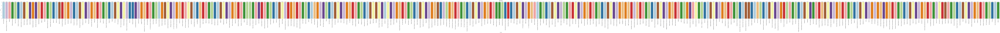

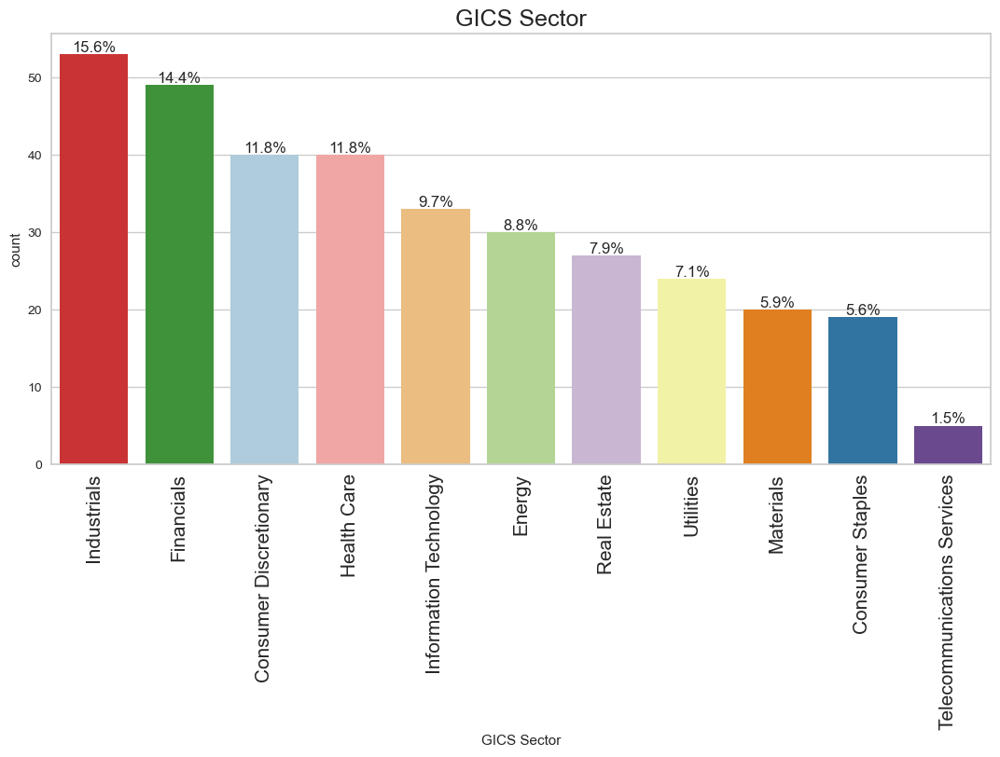

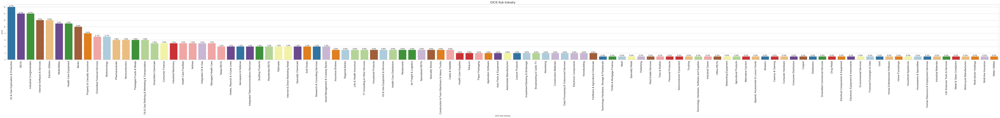

In [38]:
for i in categorical_cols:
    labeled_barplot(df, i, perc=True)

## Observations: GICS Sector Distribution

1. **Dominant Sectors**  
   - Industrials (15.6%) and Financials (14.4%) together represent almost one-third of the dataset.  
   - This concentration may influence clustering results, as these sectors are strongly represented.

2. **Moderately Represented Sectors**  
   - Health Care (11.8%), Consumer Discretionary (11.8%), and Information Technology (9.7%) form the second-largest group.  
   - These sectors provide balanced coverage across key parts of the economy.

3. **Smaller but Significant Sectors**  
   - Energy (8.8%), Real Estate (7.9%), and Utilities (7.1%) each make up a mid-tier portion of the dataset.  
   - These groups can form distinct clusters due to their unique financial profiles.

4. **Least Represented Sectors**  
   - Materials (5.9%), Consumer Staples (5.6%), and Telecommunications Services (1.5%) are underrepresented.  
   - Clusters involving these sectors may be less stable due to smallsentation is desired.

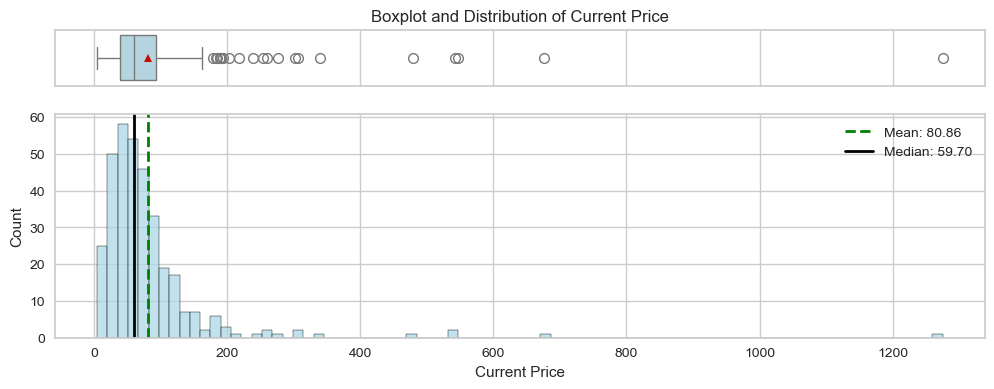

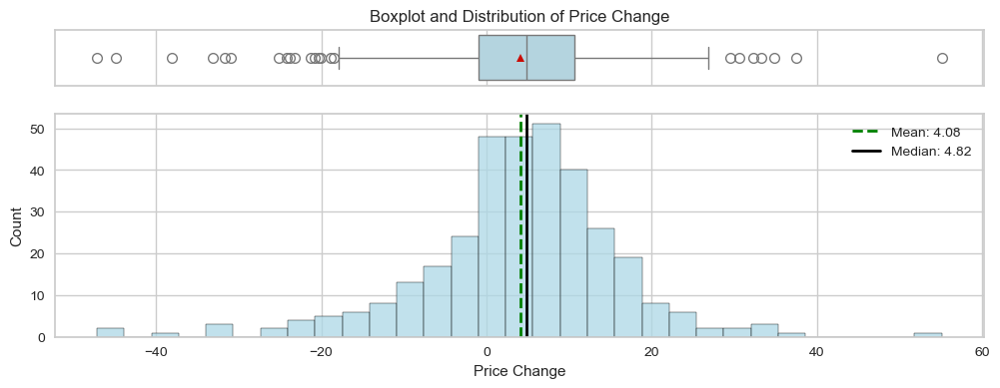

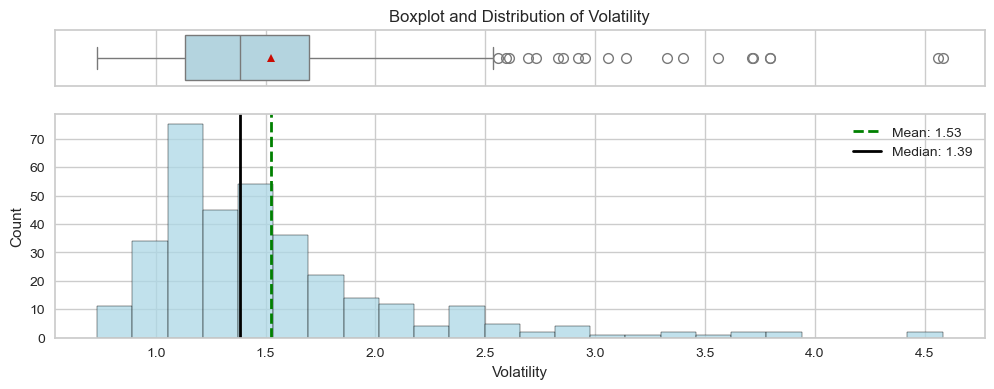

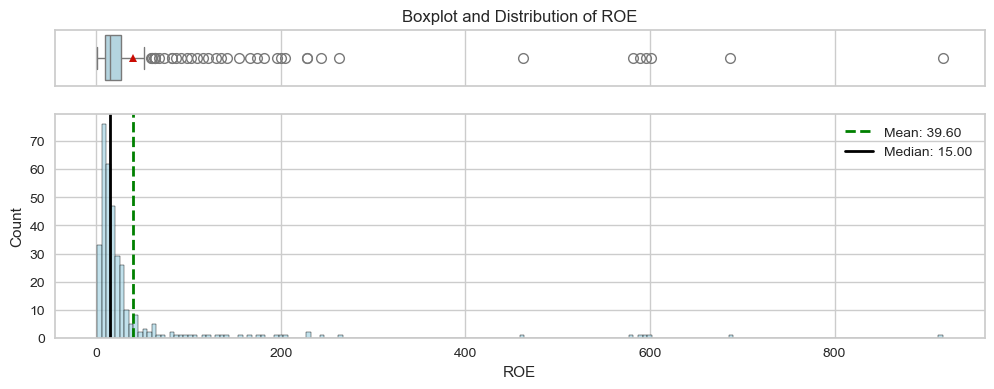

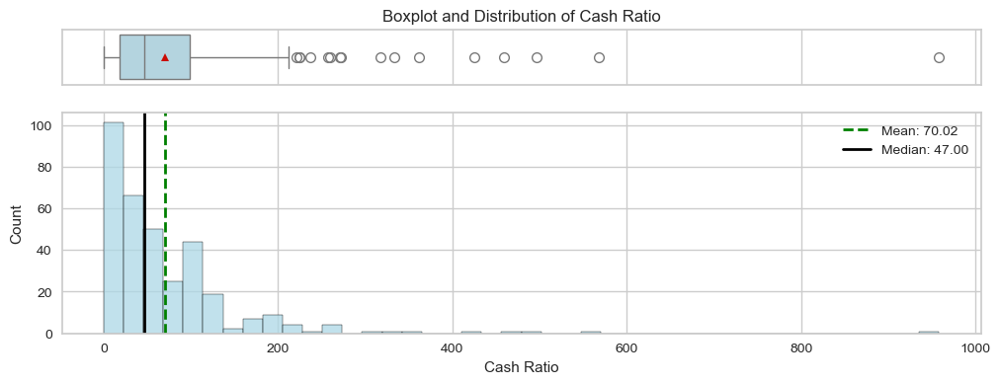

...

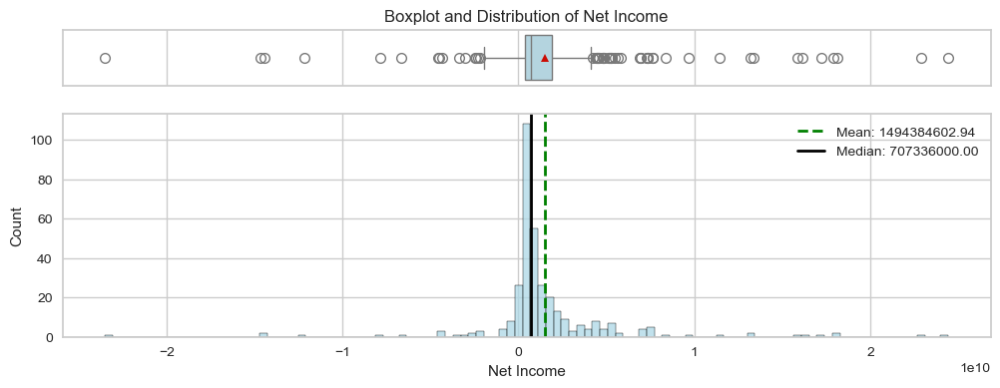

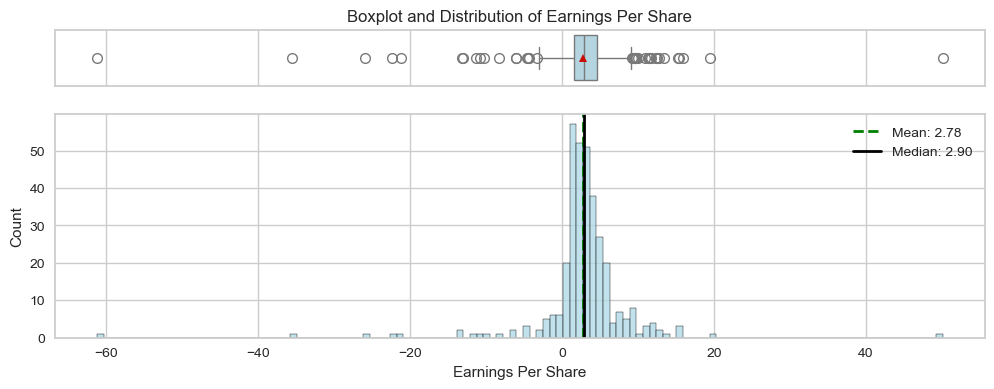

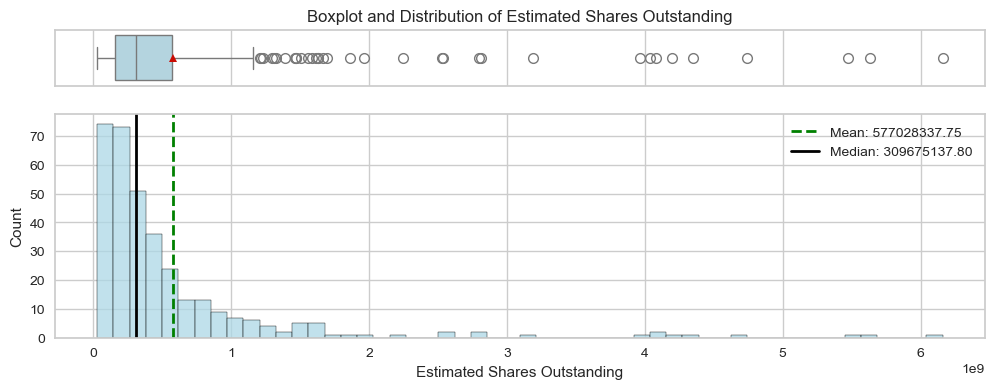

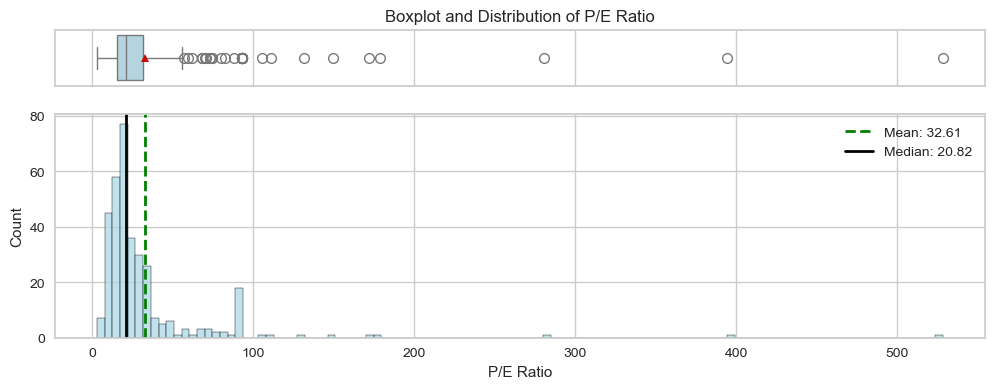

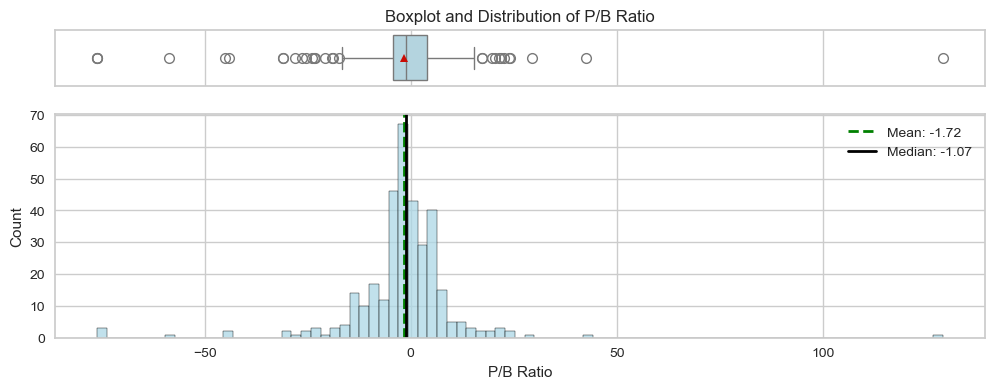

In [40]:
for i in numerical_col:
    hist_and_boxplot(df, i)

## Observations: Current Price Distribution

1. **Distribution Shape**
   - The histogram shows a **right-skewed distribution**: most stock prices fall between 0 and 200.
   - A small number of stocks have very high prices (above 400, and even beyond 1000), creating long tails.

2. **Central Tendency**
   - The **median** price is around 60, while the **mean** is higher (≈ 80), pulled upward by extreme outliers.
   - This gap between mean and median confirms strong skewness.

3. **Outliers**
   - The boxplot highlights several extreme outliers above 400, with the maximum reaching over 1200.
   - These high-price securities heavily distort the scale and need special treatment (e.g., log transformation or wind extreme values.

## Observations: Price Change Distribution

1. **Distribution Shape**
   - The histogram shows a roughly **symmetric distribution** centered near zero.
   - Most price changes fall within the range of -20 to +20, with relatively few extreme movements.

2. **Central Tendency**
   - The **median** is close to zero, consistent with the idea that price changes fluctuate around stability.
   - The **mean** is slightly positive, suggesting a small upward bias in price changes overall.

3. **Outliers**
   - The boxplot reveals several outliers on both the negative and positive sides:
     - Extreme losses below -40.
     - Large gains above +40, with a few values near +60.
   - These outliers represent unusually volatile securities and may distort distance-baseme price changes.

## Observations: Volatility Distribution

1. **Distribution Shape**
   - The histogram is **right-skewed**, with most securities clustered between 0.7 and 2.0.
   - A long tail extends beyond 3.0, with some extreme values above 4.5.

2. **Central Tendency**
   - The **median volatility** is around 1.4, while the **mean** is slightly higher (~1.5), showing upward pull from outliers.
   - This suggests that most securities are moderately volatile, but a subset is significantly more volatile.

3. **Outliers**
   - The boxplot shows multiple outliers above 2.5, with extreme values close to 4.5.
   - These represent highly volatile securities that could disproportionately impact clustering if n such as K-Means.

## Observations: ROE Distribution

1. **Distribution Shape**
   - The histogram is **heavily right-skewed**.
   - Most companies have ROE values concentrated between 0 and 50.
   - A few companies exhibit extremely high ROE values (greater than 200, some even beyond 800).

2. **Central Tendency**
   - The **median ROE** is relatively low compared to the mean, which is pulled up by extreme outliers.
   - This indicates that while the majority of firms generate modest returns, a small set shows disproportionately high returns.

3. **Outliers**
   - The boxplot highlights numerous outliers, with extreme cases well above 600–800.
   - These extreme values may reflect unique cases such as unusually profitable firms, leveraged positions, or accountissing is critical.

### Bivariate Analysis

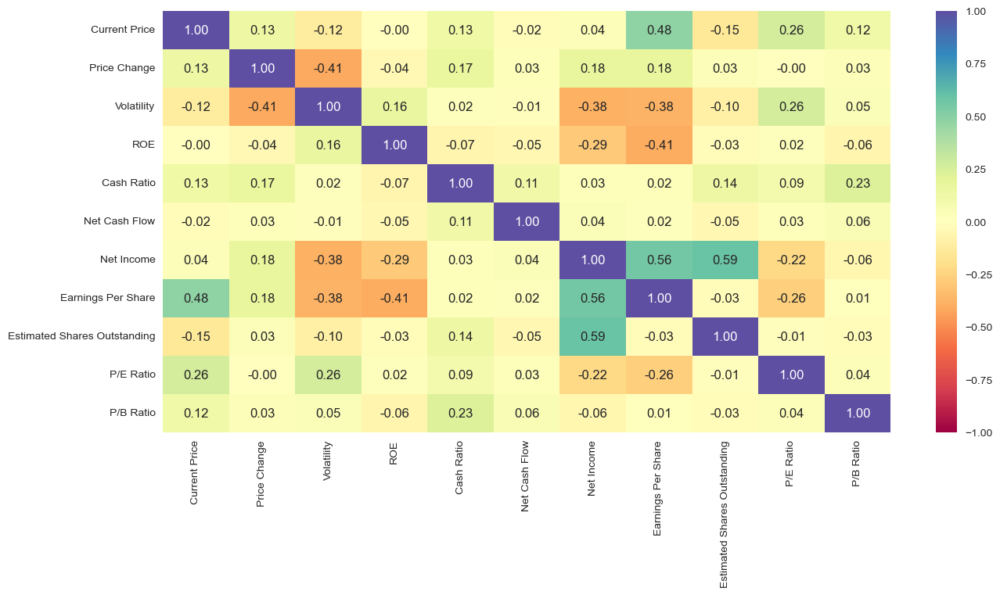

In [46]:
plt.figure(figsize=(15, 7))
sns.heatmap(df.corr(numeric_only = True), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral")
plt.show()

## Observations: Bivariate Analysis (Correlation Heatmap)

1. **Strong Positive Correlations**
   - **Net Income and Earnings Per Share (0.56)**: As expected, companies with higher net income tend to report higher EPS.
   - **Net Income and Estimated Shares Outstanding (0.59)**: Larger firms with more shares tend to generate higher absolute net income.
   - **Current Price and Earnings Per Share (0.48)**: Companies with stronger earnings generally command higher stock prices.

2. **Moderate Positive Correlations**
   - **P/E Ratio and Current Price (0.26)**: Higher-priced stocks tend to have higher P/E ratios.
   - **P/B Ratio and Cash Ratio (0.23)**: Suggests that firms with stronger liquidity might also be valued higher relative to their book value.

3. **Negative Correlations**
   - **Volatility and Net Income (-0.38)**: More volatile stocks are generally associated with weaker or unstable profitability.
   - **Volatility and EPS (-0.38)**: Highly volatile firms often have lower or less predictable earnings.
   - **ROE and EPS (-0.41)**: Negative correlation indicates potential distortions, possibly due to outliers or accounting effects (very high ROE in firms with small equity base).

4. **Weak/Negligible Correlations**
   - Most other variable pairs show low correlation (close to zero), suggesting they provide **independent signals** for clustering.
   - Example: Current Price vs. ROE (-0.00) → almost no liation-driven clusters**.

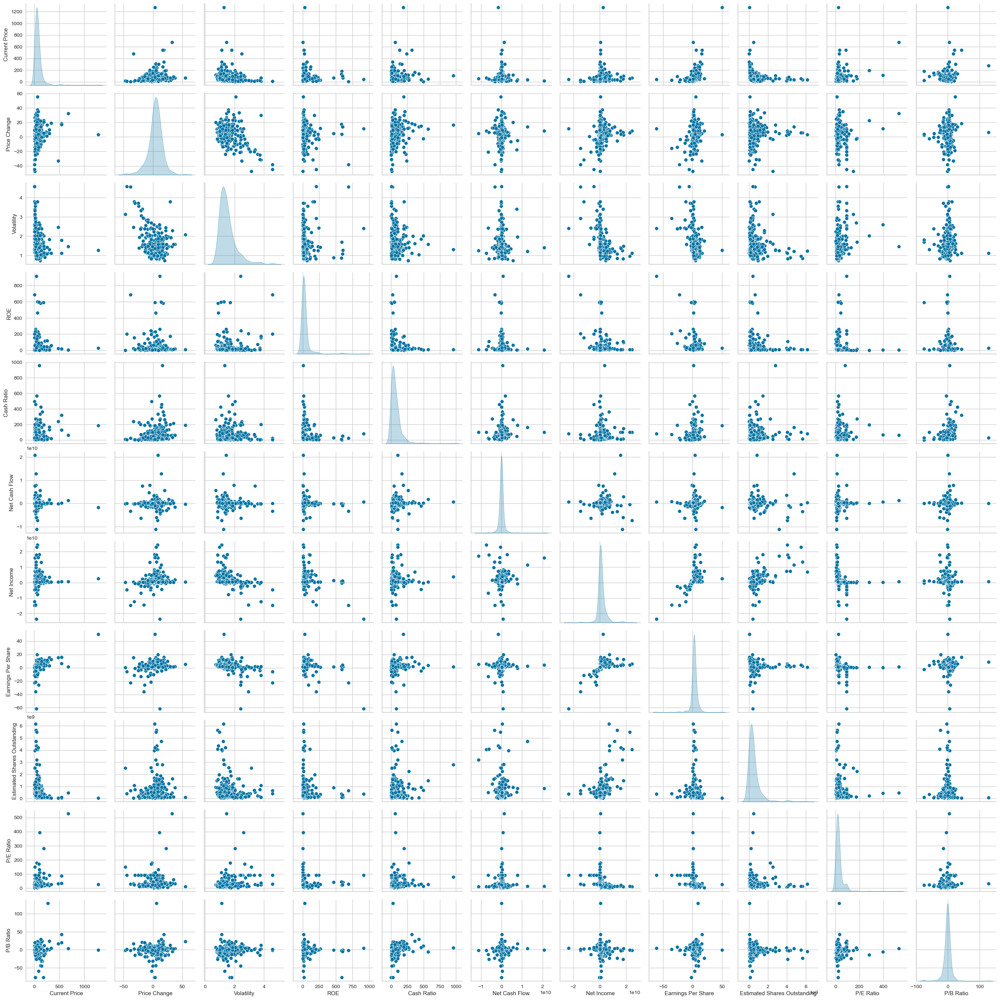

In [48]:
sns.pairplot(data=df, diag_kind="kde")
plt.show()

####  What does the distribution of stock prices look like?

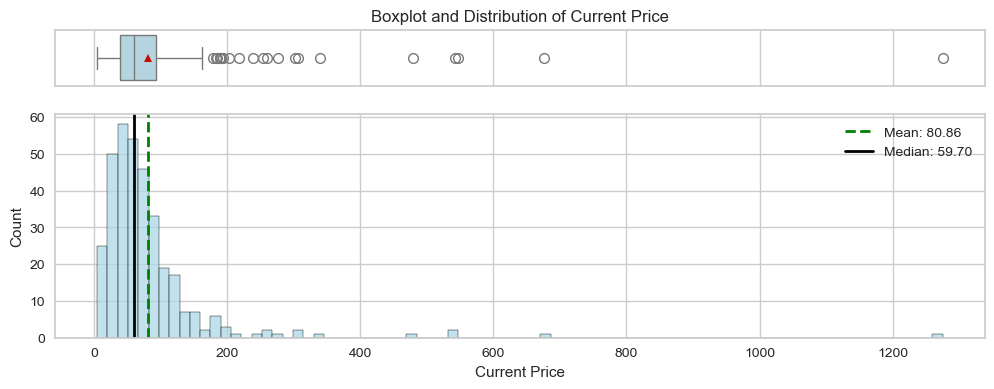

In [50]:
hist_and_boxplot(df, 'Current Price')

####  The stocks of which economic sector have seen the maximum price increase on average?

C:\Users\andre\AppData\Local\Temp\ipykernel_16772\797337779.py:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  order=(df.groupby("GICS Sector")["Price Change"]


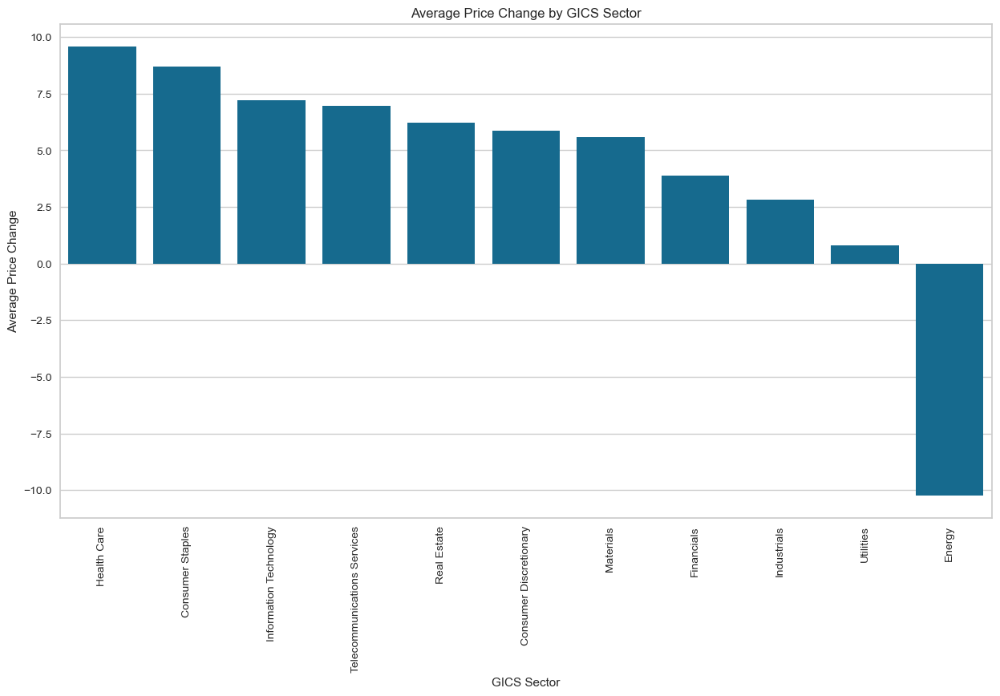

In [52]:
plt.figure(figsize=(15, 8))
sns.barplot(
    data=df,
    x="GICS Sector",
    y="Price Change",
    estimator=np.mean,
    errorbar=None,   # use ci=False if you're on seaborn < 0.12
    order=(df.groupby("GICS Sector")["Price Change"]
             .mean()
             .sort_values(ascending=False)
             .index)
)
plt.xticks(rotation=90)
plt.ylabel("Average Price Change")
plt.title("Average Price Change by GICS Sector")
plt.show()

## Observations: Average Price Change by GICS Sector

1. **Top Performing Sectors**
   - **Health Care (~+9.7)** shows the highest average price increase, indicating strong growth and positive investor sentiment.
   - **Consumer Staples (~+8.8)** also performed well, reflecting steady demand and resilience.
   - **Information Technology (~+7.3)** remains a growth-driven sector, with significant average gains.

2. **Moderately Positive Sectors**
   - **Telecommunications Services, Real Estate, Consumer Discretionary, and Materials** show moderate gains (between +6 and +7).
   - These sectors indicate stable but less aggressive price growth compared to Health Care and IT.

3. **Low Positive Growth**
   - **Financials (~+5.5)** and **Industrials (~+3.0)** recorded smaller gains.
   - **Utilities (~+1.0)** shows only marginal positive change, indicating limited market momentum.

4. **Negative Performing Sector**
   - **Energy (~-10.0)** is the only sector with a significant negative average price change.
   - This highlights sector-wide challenges, possibly tied to commodity price volatility orce and risk analysis.

####  How are the different variables correlated with each other?

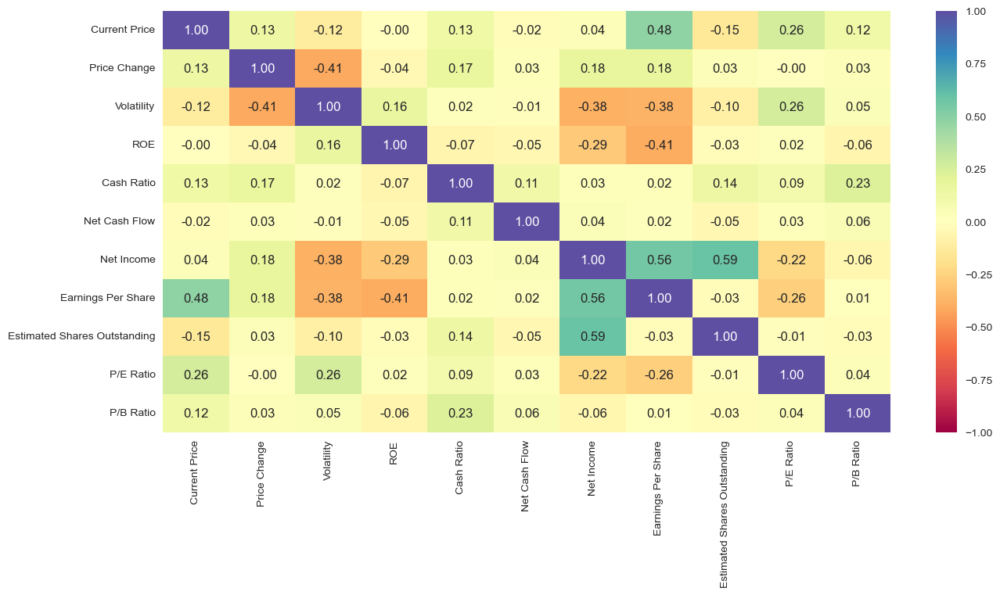

In [55]:
plt.figure(figsize=(15, 7))
sns.heatmap(df.corr(numeric_only = True), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral")
plt.show()

####  Cash ratio provides a measure of a company's ability to cover its short-term obligations using only cash and cash equivalents. How does the average cash ratio vary across economic sectors?

C:\Users\andre\AppData\Local\Temp\ipykernel_16772\1061837740.py:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  order=(df.groupby("GICS Sector")["Cash Ratio"]


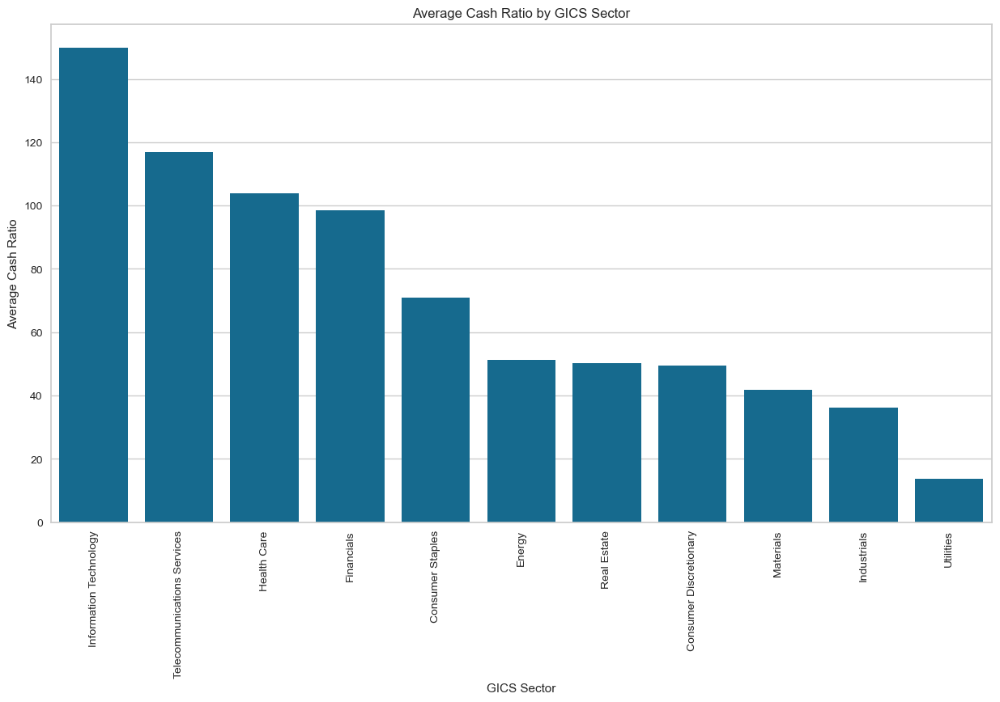

In [57]:
plt.figure(figsize=(15, 8))
sns.barplot(
    data=df,
    x="GICS Sector",
    y="Cash Ratio",
    estimator=np.mean,
    errorbar=None,   # use ci=False if you're on seaborn < 0.12
    order=(df.groupby("GICS Sector")["Cash Ratio"]
             .mean()
             .sort_values(ascending=False)
             .index)
)
plt.xticks(rotation=90)
plt.ylabel("Average Cash Ratio")
plt.title("Average Cash Ratio by GICS Sector")
plt.show()

## Observations: Average Cash Ratio by GICS Sector

1. **Top Sectors with High Liquidity**
   - **Information Technology (~150)** has the highest average cash ratio, suggesting firms in this sector maintain very large cash reserves relative to liabilities.
   - **Telecommunications Services (~117)** and **Health Care (~104)** also show strong liquidity positions.
   - These sectors are generally growth-oriented and cash-rich, which provides flexibility for innovation and acquisitions.

2. **Moderately Strong Liquidity**
   - **Financials (~99)** and **Consumer Staples (~71)** maintain above-average liquidity, reflecting stability and resilience.
   - Financial institutions often hold cash reserves as part of regulatory requirements.

3. **Mid-Tier Liquidity**
   - **Energy (~51), Real Estate (~50), and Consumer Discretionary (~49)** fall into the middle range.
   - These sectors may reinvest more cash into operations, infrastructure, or expansion projects, limiting their cash ratios.

4. **Lowest Liquidity Sectors**
   - **Materials (~42), Industrials (~36), and Utilities (~14)** show the lowest average cash ratios.
   - Particularly, **Utilities** have very low liquidity levels, likely due to their capital-intensive nature and reliance on steady but predictable cash flows.

####  P/E ratios can help determine the relative value of a company's shares as they signify the amount of money an investor is willing to invest in a single share of a company per dollar of its earnings. How does the P/E ratio vary, on average, across economic sectors?

C:\Users\andre\AppData\Local\Temp\ipykernel_16772\2735577740.py:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  order=(df.groupby("GICS Sector")["P/E Ratio"]


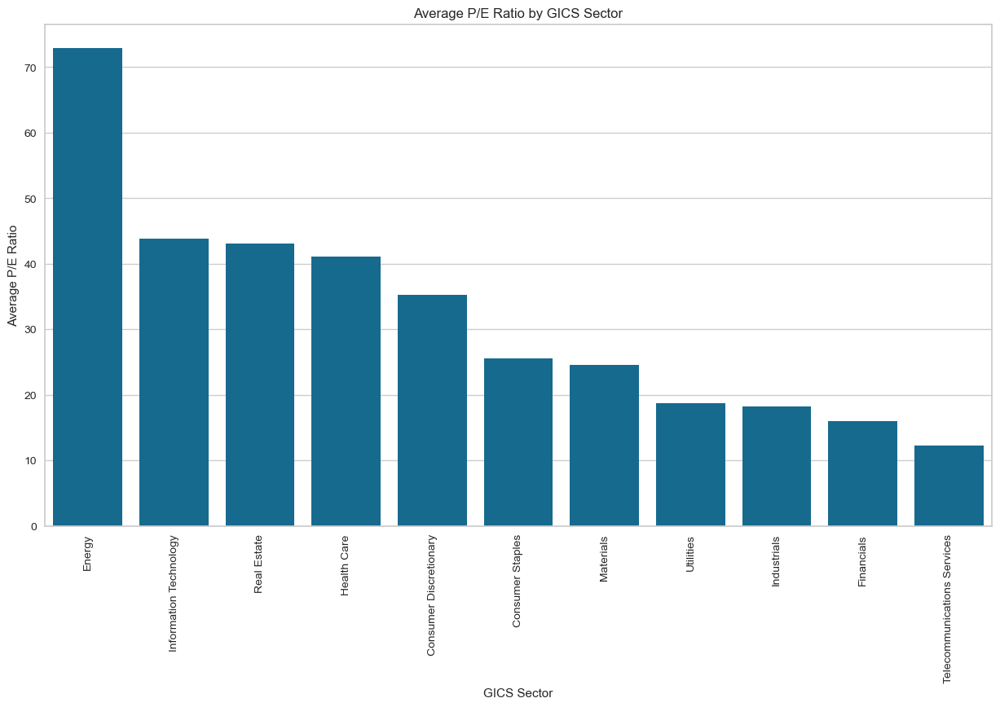

In [60]:

plt.figure(figsize=(15, 8))
sns.barplot(
    data=df,
    x="GICS Sector",
    y="P/E Ratio",
    estimator=np.mean,
    errorbar=None,   # use ci=False if seaborn < 0.12
    order=(df.groupby("GICS Sector")["P/E Ratio"]
             .mean()
             .sort_values(ascending=False)
             .index)
)
plt.xticks(rotation=90)
plt.ylabel("Average P/E Ratio")
plt.title("Average P/E Ratio by GICS Sector")
plt.show()

## Observations: Average P/E Ratio by GICS Sector

1. **Sectors with the Highest P/E Ratios**
   - **Energy (~73)** shows the highest average P/E ratio by far, which is unusual compared to typical market patterns.  
     - This may reflect **very low earnings relative to stock prices**, possibly driven by volatile commodity markets or firms priced on future growth expectations.
   - **Information Technology (~44)** and **Real Estate (~43)** also display high P/E ratios, consistent with sectors where investors expect significant growth.

2. **Moderately Valued Sectors**
   - **Health Care (~41)** and **Consumer Discretionary (~35)** show mid-range P/E ratios, reflecting both growth opportunities and relatively steady earnings.  
   - These sectors are often seen as having **mixed investor expectations**—growth-oriented firms balanced with stable earners.

3. **Lower Valuation Sectors**
   - **Consumer Staples (~26)** and **Materials (~25)** are in the middle-to-lower tier, suggesting more defensive positioning with steady but modest earnings growth.  
   - **Utilities (~19)** and **Industrials (~18)** also sit in the lower range, aligning with their status as stable, mature sectors.

4. **Lowest Valuation Sectors**
   - **Financials (~16)** and **Telecommunications Services (~12)** have the lowest average P/E ratios.  
   - This implies these sectors are seen as more **value-oriented** or facing lower growth expectations relative to others.

## Data Preprocessing

- Duplicate value check
- Missing value treatment
- Outlier check
- Feature engineering (if needed)
- Any other preprocessing steps (if needed)

#### Missing value treatment (if needed)

In [64]:
df.isnull().sum()

Security                        0
GICS Sector                     0
GICS Sub Industry               0
Current Price                   0
Price Change                    0
Volatility                      0
ROE                             0
Cash Ratio                      0
Net Cash Flow                   0
Net Income                      0
Earnings Per Share              0
Estimated Shares Outstanding    0
P/E Ratio                       0
P/B Ratio                       0
dtype: int64

In [65]:
# Raw numeric columns as they appear in the dataset.
NUM = [
    "Current Price", "Price Change", "Volatility", "ROE", "Cash Ratio",
    "Net Cash Flow", "Net Income", "Earnings Per Share",
    "Estimated Shares Outstanding", "P/E Ratio", "P/B Ratio"
]

# Keep Sector only; Sub-Industry is high-cardinality (104+) and is better used for interpretation
# or reduced separately (e.g., with target encoding or PCA on OHE) if needed.
CAT = ["GICS Sector"]

In [66]:
# create new veraiable market capitalisation 
df['Market_Cap'] = df['Current Price'] * df['Estimated Shares Outstanding']
NUM.append('Market_Cap')

In [67]:
def winsorize(df: pd.DataFrame, cols, low: float = 0.01, high: float = 0.99) -> pd.DataFrame:
    """
    Clip extreme tails (outliers) in each numeric column to the [low, high] quantile range.
    This reduces the influence of extreme values on distance-based clustering.
    """

    df = df.copy()
    for c in cols:
        if c in df:
            lo, hi = df[c].quantile([low, high])
            df[c] = df[c].clip(lo, hi)
    return df

def signed_log(x: pd.Series) -> pd.Series:
    """
    Signed log transform for variables that can be negative or positive.
    Preserves sign, compresses heavy tails, and yields a symmetric scale around 0.
    Formula: sign(x) * log(1 + |x|)
    """
    return np.sign(x) * np.log1p(np.abs(x))


def make_features(df: pd.DataFrame):
    """
    Create robust, model-ready features for clustering:
      - Diagnostic flags for problematic ratios (P/E, P/B).
      - Winsorization of heavy-tailed variables.
      - log1p for strictly-positive variables, signed_log for variables that can be <= 0.
      - Cleaned P/E where EPS<=0 is set to NaN (P/E not meaningful then).
      - Return the transformed DataFrame and the final list of numeric columns to feed the pipeline.
    """
    out = df.copy()

    # ---- Flags that carry important discrete signals for valuation anomalies ----
    out["eps_pos"] = (out["Earnings Per Share"] > 0).astype(int)   # EPS > 0 or not
    out["pb_neg"]  = (out["P/B Ratio"] < 0).astype(int)            # Negative book equity flag

    # ---- P/E cleaning: P/E is not meaningful when EPS <= 0 (division by ~0 or negative earnings) ----
    pe = out["P/E Ratio"].astype(float).copy()
    pe[out["Earnings Per Share"] <= 0] = np.nan
    out["PE_clean"] = pe

    # ---- Winsorize heavy-tailed variables to limit the impact of outliers ----
    heavy = [
        "Current Price", "ROE", "Cash Ratio",
        "Net Cash Flow", "Net Income", "Earnings Per Share",
        "Estimated Shares Outstanding", "P/B Ratio", "PE_clean", 'Market_Cap'
    ]
    out = winsorize(out, [c for c in heavy if c in out.columns], low=0.01, high=0.99)

    # ---- Transformations to reduce skew and stabilize variance ----
    # Positive-only: log1p (keeps zero, compresses large values).
    out["Price_log"] = np.log1p(out["Current Price"])
    out["ROE_log"]   = np.log1p(out["ROE"])
    out["Cash_log"]  = np.log1p(out["Cash Ratio"])
    out["Market_Cap_log"]  = np.log1p(out["Market_Cap"])

    # Can be negative or positive: signed_log (preserves sign and compresses tails).
    out["NI_slog"]     = signed_log(out["Net Income"])
    out["NCF_slog"]    = signed_log(out["Net Cash Flow"])
    out["EPS_slog"]    = signed_log(out["Earnings Per Share"])
    out["Shares_slog"] = signed_log(out["Estimated Shares Outstanding"])
    out["PB_slog"]     = signed_log(out["P/B Ratio"])
    out["PE_slog"]     = signed_log(out["PE_clean"])

    # ---- Final numeric set to feed into scaler + PCA + clustering ----
    keep_num = [
        # risk / flow variables that are already reasonably centered
        "Price Change", "Volatility",
        # transformed heavy-tailed positives
        "Price_log", "ROE_log", "Cash_log",
        # transformed signed vars
        "NI_slog", "NCF_slog", "EPS_slog", "Shares_slog", "PB_slog", "PE_slog", "Market_Cap_log",
        # diagnostic flags as binary features
        "eps_pos", "pb_neg"
    ]
    return out, keep_num

def get_ct_feature_names(ct, num_names, cat_input_names):
    """
    Build readable feature names from a *fitted* ColumnTransformer.
    Works whether the categorical branch is a Pipeline with OHE.
    """
    names = []

    # numeric block
    if "num" in getattr(ct, "named_transformers_", {}):
        names.extend(list(num_names))

    # categorical block
    if "cat" in getattr(ct, "named_transformers_", {}):
        cat_trans = ct.named_transformers_["cat"]
        ohe = None
        if hasattr(cat_trans, "named_steps") and "ohe" in cat_trans.named_steps:
            ohe = cat_trans.named_steps["ohe"]

        if ohe is not None:
            # Try modern API first
            try:
                cat_names = ohe.get_feature_names_out(cat_input_names)
            except Exception:
                # Fallback: build from categories_
                cat_names = []
                for base, cats in zip(cat_input_names, ohe.categories_):
                    cat_names.extend([f"{base}_{c}" for c in cats])
            names.extend(list(cat_names))
        else:
            # If no OHE inside, just keep the raw cat column names
            names.extend(list(cat_input_names))

    return names

In [68]:
# Apply feature engineering and build preprocessing pipeline
# NOTE: assumes you already have a DataFrame `df` with the original columns.
df_proc, USE_NUM = make_features(df)

# Numeric branch:
#   - Median imputation: robust to remaining missing values (esp. after PE_clean step).
#   - RobustScaler: scales by IQR and median -> less sensitive to outliers than StandardScaler.
num_pipe = Pipeline(steps=[
    ("imp", SimpleImputer(strategy="median")),
    ("scaler", RobustScaler())
])

# Categorical branch:
#   - Impute most frequent category (safe default).
#   - OneHotEncoder with dense output; handle_unknown="ignore" avoids errors on unseen categories.
cat_pipe = Pipeline(steps=[
    ("imp", SimpleImputer(strategy="most_frequent")),
    ("ohe", OneHotEncoder(drop='first', handle_unknown="ignore", sparse_output=False))
])

# ColumnTransformer merges both branches; everything else is dropped.
ct = ColumnTransformer(
    transformers=[
        ("num", num_pipe, USE_NUM),
        ("cat", cat_pipe, CAT)
    ],
    remainder="drop"
)

# Fit the preprocessor and transform to the scaled design matrix.
# Fit-transform -> numpy array
X_scaled_np = ct.fit_transform(df_proc)

# 1) Try to get names from ColumnTransformer directly (sklearn >= 1.0)
try:
    scaled_feature_names = ct.get_feature_names_out()
    # Optional: make names cleaner by stripping 'num__'/'cat__' prefixes
    scaled_feature_names = [n.replace("num__", "").replace("cat__", "") for n in scaled_feature_names]
except Exception:
    # 2) Fallback to our helper if .get_feature_names_out() is unavailable
    scaled_feature_names = get_ct_feature_names(ct, num_names=USE_NUM, cat_input_names=CAT)

# Build a DataFrame with proper column names and original index
X_scaled = pd.DataFrame(X_scaled_np, columns=scaled_feature_names, index=df_proc.index)

print("X_scaled DataFrame:")
X_scaled.head()

X_scaled DataFrame:


,Price Change,Volatility,Price_log,ROE_log,Cash_log,NI_slog,NCF_slog,EPS_slog,Shares_slog,PB_slog,PE_slog,Market_Cap_log,eps_pos,pb_neg,GICS Sector_Consumer Staples,GICS Sector_Energy,GICS Sector_Financials,GICS Sector_Health Care,GICS Sector_Industrials,GICS Sector_Information Technology,GICS Sector_Materials,GICS Sector_Real Estate,GICS Sector_Telecommunications Services,GICS Sector_Utilities
0,0.445251,0.537853,-0.389567,2.233571,0.048197,1.410255,-0.914326,1.469883,0.599324,-0.475396,-2.051031,0.348774,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,0.302530,1.448791,-0.008896,2.194476,0.292346,1.177778,0.083926,0.080598,1.295870,-0.474326,-0.089482,1.253731,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.557080,-0.199666,-0.323185,0.332368,0.209731,1.088134,0.160489,0.014642,1.231944,0.120439,-0.438394,0.989489,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.787083,-0.049787,0.517410,-0.490539,0.799224,-0.069154,-0.890151,-0.691337,0.372841,0.726189,2.289778,0.721334,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,-0.571326,0.562854,-0.086743,-0.067358,1.046690,-0.008840,0.131808,-1.384007,1.544972,0.443028,3.823795,1.438610,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [69]:
print("\n--- Statistics of the Final Dataset (confirming mean ~0, std dev ~1): ---")
X_scaled.describe()


--- Statistics of the Final Dataset (confirming mean ~0, std dev ~1): ---


,Price Change,Volatility,Price_log,ROE_log,Cash_log,NI_slog,NCF_slog,EPS_slog,Shares_slog,PB_slog,PE_slog,Market_Cap_log,eps_pos,pb_neg,GICS Sector_Consumer Staples,GICS Sector_Energy,GICS Sector_Financials,GICS Sector_Health Care,GICS Sector_Industrials,GICS Sector_Information Technology,GICS Sector_Materials,GICS Sector_Real Estate,GICS Sector_Telecommunications Services,GICS Sector_Utilities
count,340.000000,3.400000e+02,3.400000e+02,340.000000,340.000000,340.000000,3.400000e+02,3.400000e+02,340.000000,3.400000e+02,340.000000,3.400000e+02,340.000000,340.000000,340.000000,340.000000,340.000000,340.000000,340.000000,340.000000,340.000000,340.000000,340.000000,340.000000
mean,-0.063714,2.503847e-01,-4.171160e-03,0.172801,-0.127400,-2.128071,-3.757515e-01,-2.881242e-01,0.056244,1.206109e-01,0.149903,8.152627e-02,-0.100000,-0.382353,0.055882,0.088235,0.144118,0.117647,0.155882,0.097059,0.058824,0.079412,0.014706,0.070588
std,1.031918,1.055519e+00,8.301000e-01,1.041836,0.719516,7.257854,5.001517e-01,1.380762e+00,0.757512,5.661492e-01,1.013079,7.274869e-01,0.300442,0.486678,0.230033,0.284055,0.351727,0.322665,0.363278,0.296474,0.235641,0.270779,0.120550,0.256513
min,-4.464917,-1.163660e+00,-2.312896e+00,-1.747116,-2.132734,-25.791680,-9.723648e-01,-5.706408e+00,-1.547952,-9.997922e-01,-2.051031,-1.305701e+00,-1.000000,-1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,-0.494972,-4.471692e-01,-4.955803e-01,-0.415933,-0.558045,-0.413760,-8.844517e-01,-5.342633e-01,-0.520303,-2.909020e-01,-0.440990,-4.628885e-01,0.000000,-1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,-1.981922e-16,5.138034e-16,0.000000,0.000000,0.000000,2.341877e-17,-1.405126e-16,0.000000,-1.691355e-17,0.000000,1.307114e-15,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.505028,5.528308e-01,5.044197e-01,0.584067,0.441955,0.586240,1.155483e-01,4.657367e-01,0.479697,7.090980e-01,0.559010,5.371115e-01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,4.317343,5.697550e+00,2.483321e+00,3.772682,1.343249,1.908992,2.124803e-01,1.822056e+00,2.100814,1.205784e+00,3.823795,2.043514e+00,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [70]:
X_scaled.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 340 entries, 0 to 339
Data columns (total 24 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   Price Change                             340 non-null    float64
 1   Volatility                               340 non-null    float64
 2   Price_log                                340 non-null    float64
 3   ROE_log                                  340 non-null    float64
 4   Cash_log                                 340 non-null    float64
 5   NI_slog                                  340 non-null    float64
 6   NCF_slog                                 340 non-null    float64
 7   EPS_slog                                 340 non-null    float64
 8   Shares_slog                              340 non-null    float64
 9   PB_slog                                  340 non-null    float64
 10  PE_slog                                  340 non-n

### Post Preprocessing EDA

In [72]:
numerical_col = X_scaled.select_dtypes(include=np.number).columns.tolist()

In [73]:
numerical_col

['Price Change',
 'Volatility',
 'Price_log',
 'ROE_log',
 'Cash_log',
 'NI_slog',
 'NCF_slog',
 'EPS_slog',
 'Shares_slog',
 'PB_slog',
 'PE_slog',
 'Market_Cap_log',
 'eps_pos',
 'pb_neg',
 'GICS Sector_Consumer Staples',
 'GICS Sector_Energy',
 'GICS Sector_Financials',
 'GICS Sector_Health Care',
 'GICS Sector_Industrials',
 'GICS Sector_Information Technology',
 'GICS Sector_Materials',
 'GICS Sector_Real Estate',
 'GICS Sector_Telecommunications Services',
 'GICS Sector_Utilities']

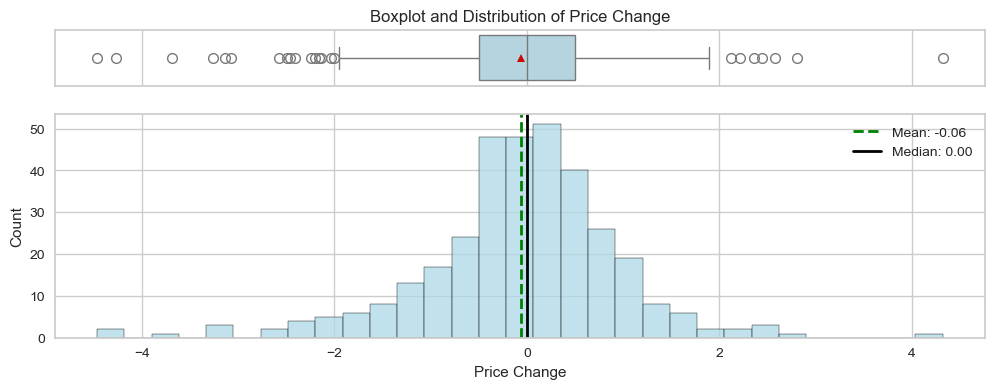

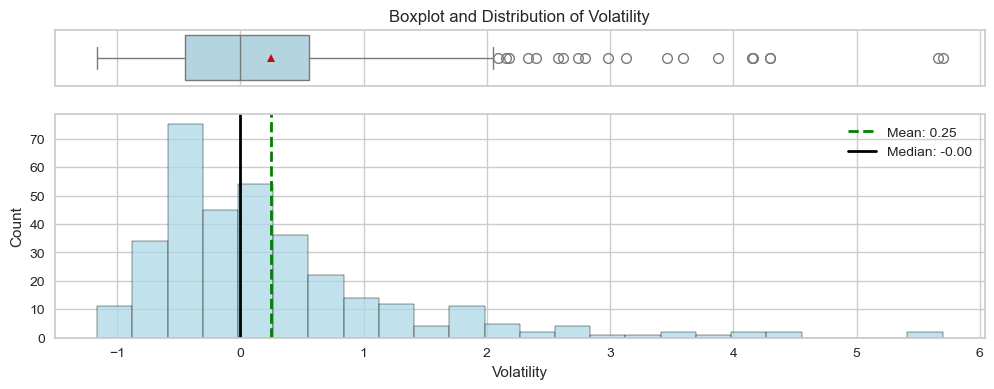

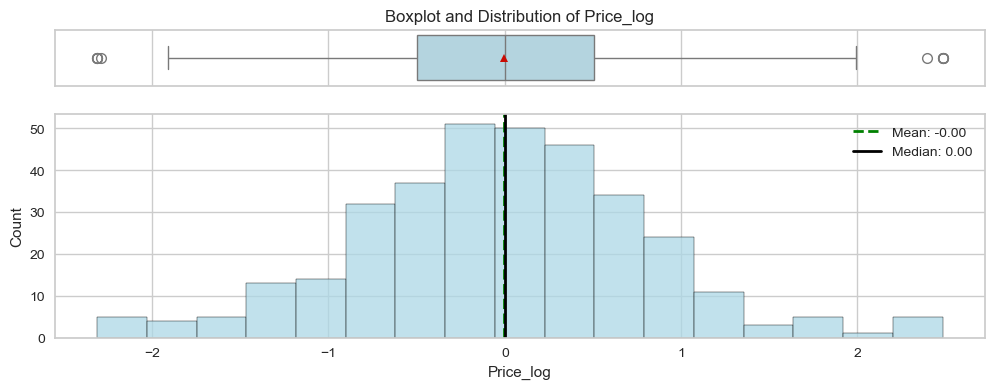

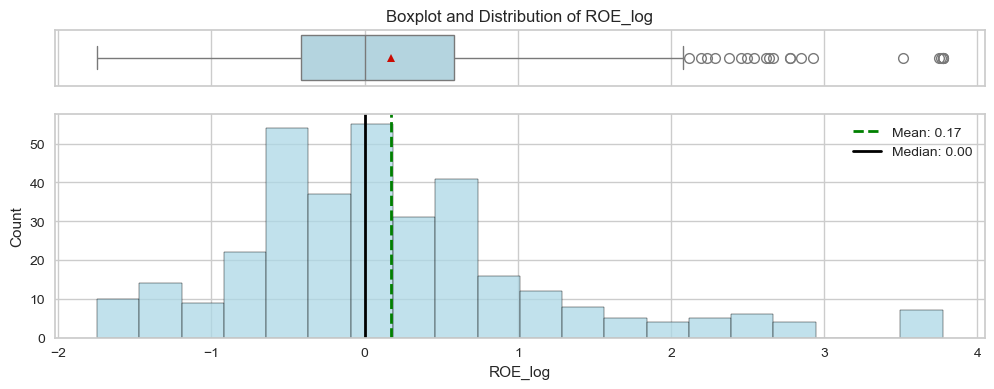

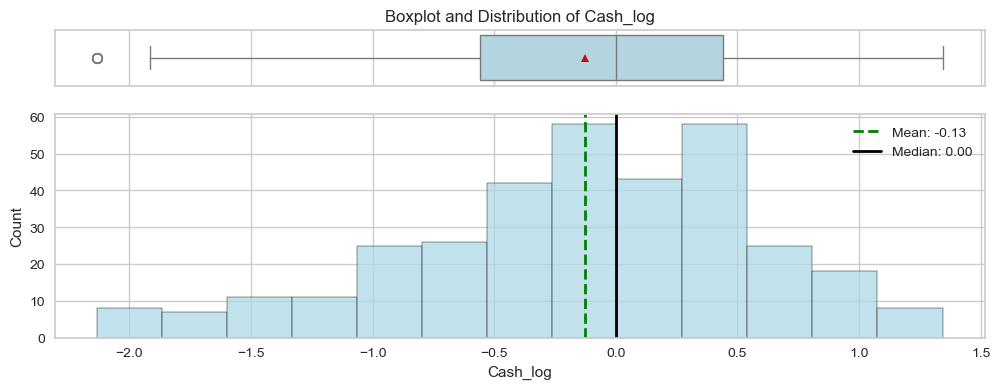

...

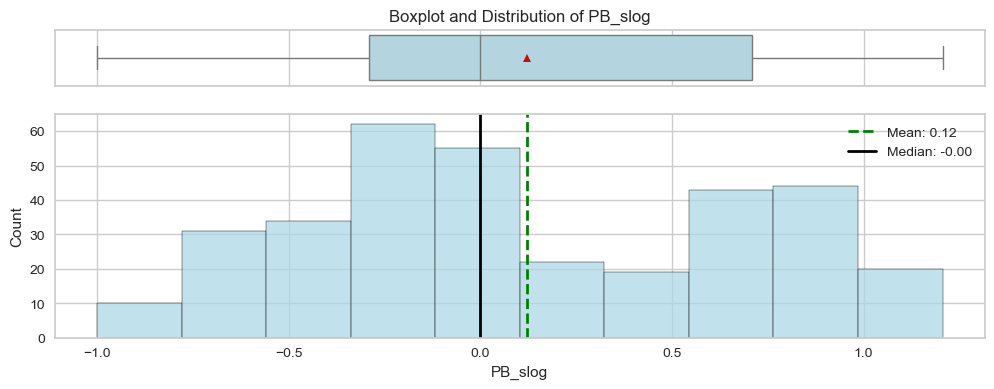

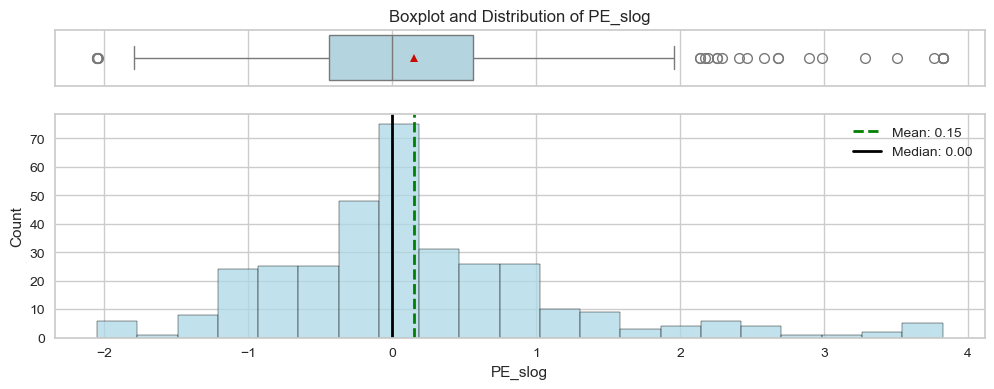

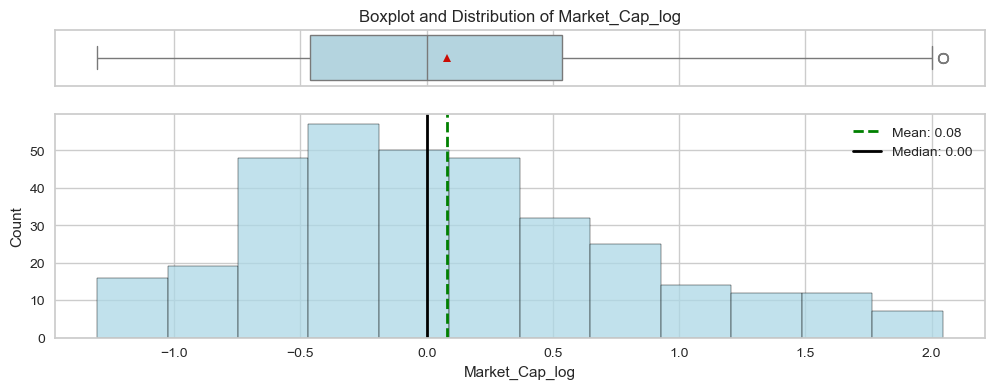

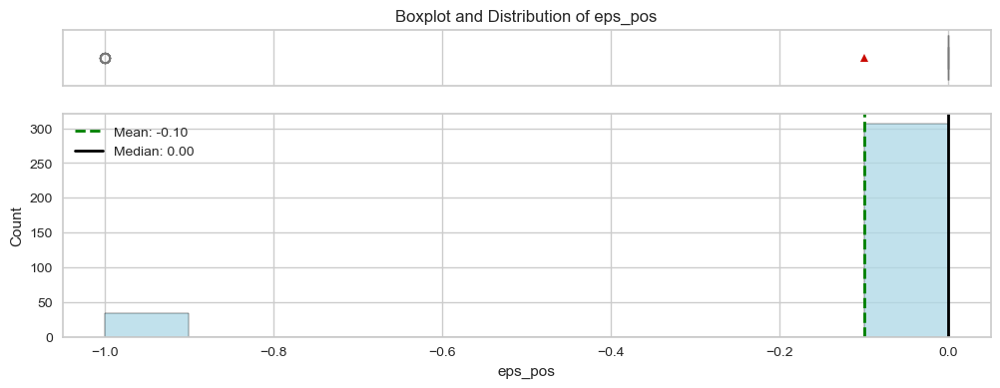

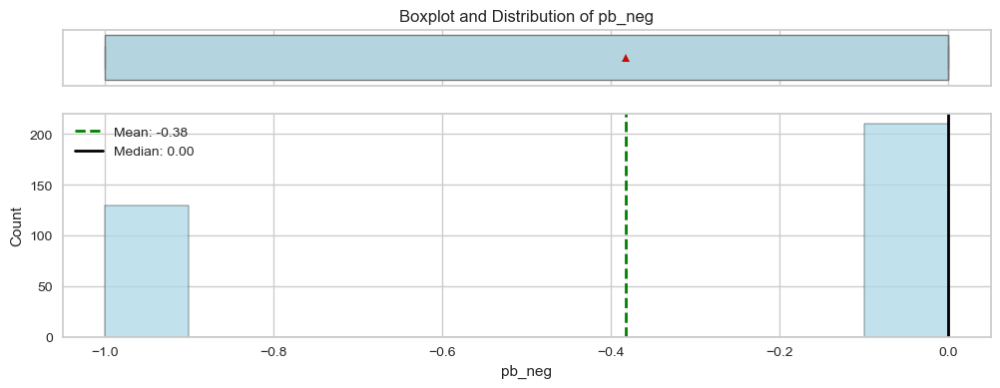

In [74]:
# Plot all the numerical variables to check weather distribution is preserved
numerical_variables = [
    'Price Change',
 'Volatility',
 'Price_log',
 'ROE_log',
 'Cash_log',
 'NI_slog',
 'NCF_slog',
 'EPS_slog',
 'Shares_slog',
 'PB_slog',
 'PE_slog',
 'Market_Cap_log',
 'eps_pos',
 'pb_neg',
    ]
# Loop through the list and creating a histogram and boxplot for each variable
for variable in numerical_variables:
   hist_and_boxplot(X_scaled, variable)

### Observations

It seems like the distribution and scewness of the data is retained even with the removal of the outliers, so it is safe to keep them.

In [77]:
X_scaled.shape

(340, 24)

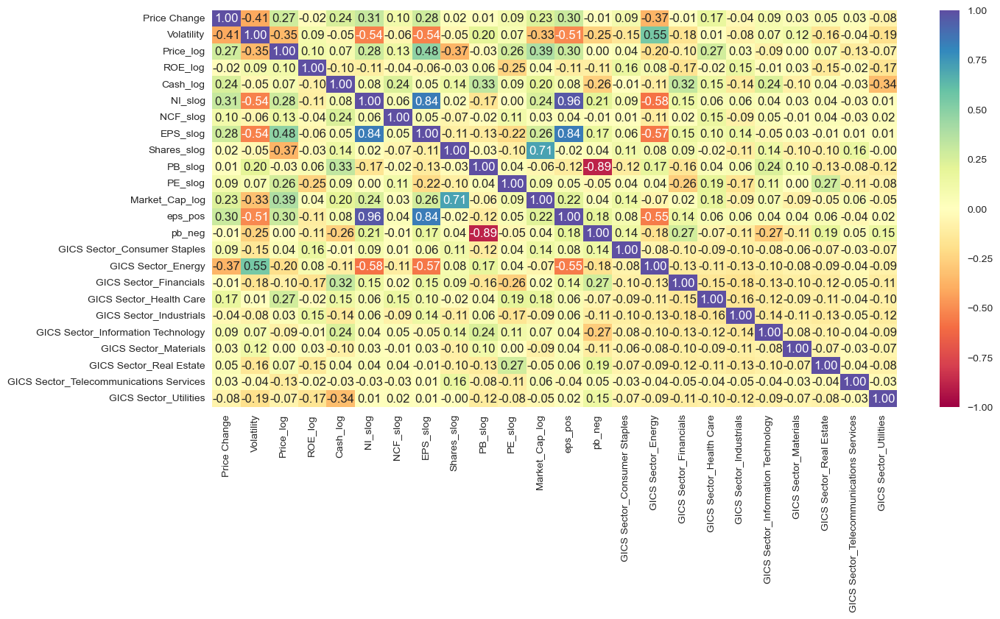

In [78]:
plt.figure(figsize=(15, 7))
sns.heatmap(X_scaled.corr(numeric_only = True), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral")
plt.show()

## Observations: Correlation Heatmap (post-transformation features)

1. **Strong “Size/Earnings” collinearity**
   - `NI_slog` ↔ `EPS_slog` ≈ **0.84** — firms with higher net income have higher EPS.
   - `Market_Cap_log` is tightly linked to `Shares_slog` and `Price_log` (≈ **0.89–0.99**), which is expected since market cap = price × shares.
   - **Takeaway:** there’s a dense block of size/earnings variables; using all of them without reduction double-counts similar information.

2. **Risk vs. fundamentals**
   - `Volatility` is **positively** correlated with `Price Change` (≈ **0.41**): more volatile stocks move more.
   - `Volatility` shows **negative** links to fundamentals (e.g., `ROE_log` ≈ **−0.35**; weaker negatives with `Cash_log` and valuation metrics).
   - **Takeaway:** risk and quality are partly opposed — useful for cluster separation.

3. **Valuation relations**
   - `PE_slog` is **positively** related to `Price_log` (≈ **0.2–0.3**) and **negatively** to `EPS_slog`/`NI_slog` (≈ **−0.1…−0.3**), consistent with high P/E when current earnings are relatively low.
   - `PB_slog` is more weakly connected to others, adding an independent valuation angle.

4. **Diagnostic flags behave as expected**
   - `eps_pos` is **positively** correlated with `EPS_slog` and `NI_slog`, and **negatively** with `PE_slog` (EPS>0 typically yields lower P/E).
   - `pb_neg` correlates **negatively** with size/earnings (`Market_Cap_log`, `EPS_slog`) and **slightly positively** with `Volatility` — a marker of distressed firms.

5. **Sector one-hots (OHE)**
   - Most sector dummies have **weak** correlations with numerics (< |0.2|), so OHE does not dominate distances.
   - Notable signals: **Energy** shows a **negative** link with `Price Change` (~ **−0.55**); **Health Care** has mild positive ties to profitability/valuation.

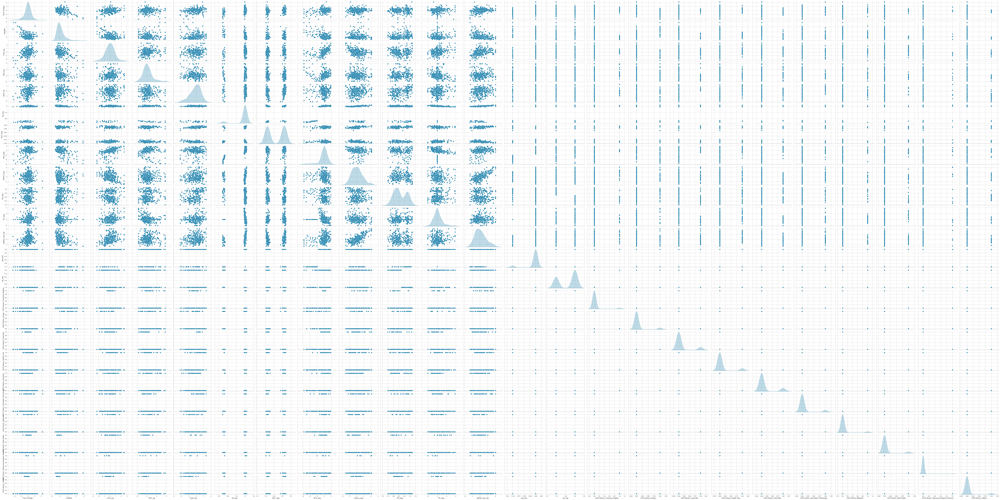

In [80]:
# Create a pairplot to Visualize the scaled data
sns.pairplot(X_scaled, height=2,aspect=2 , diag_kind='kde')

## K-means Clustering

In [82]:
k_means_scaled = X_scaled.copy()

Number of Clusters: 1 	Average Distortion: 5.4634401297806345
Number of Clusters: 2 	Average Distortion: 2.807029847103615
Number of Clusters: 3 	Average Distortion: 2.628217077042079
Number of Clusters: 4 	Average Distortion: 2.519803614528676
Number of Clusters: 5 	Average Distortion: 2.4684995127307316
Number of Clusters: 6 	Average Distortion: 2.4135075510371258
Number of Clusters: 7 	Average Distortion: 2.3555330345898873
Number of Clusters: 8 	Average Distortion: 2.3051756594701542
Number of Clusters: 9 	Average Distortion: 2.266449077590416
Number of Clusters: 10 	Average Distortion: 2.226157728093461
Number of Clusters: 11 	Average Distortion: 2.1921936035413117
Number of Clusters: 12 	Average Distortion: 2.167451292531721
Number of Clusters: 13 	Average Distortion: 2.122558707893301
Number of Clusters: 14 	Average Distortion: 2.0893195509351963


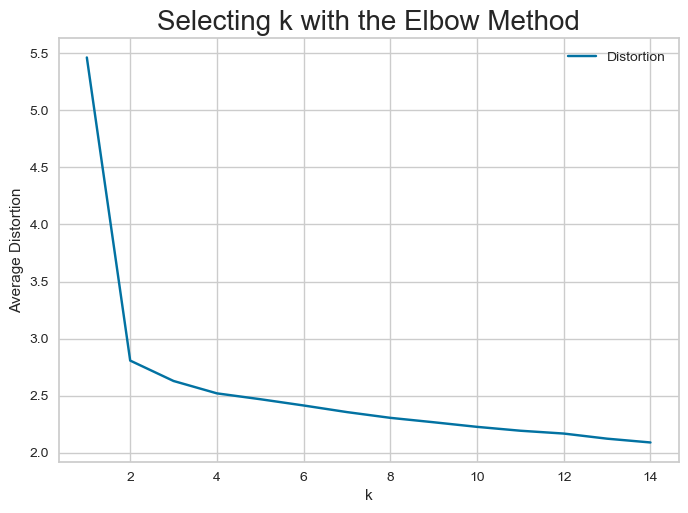

In [83]:

# Step 1: Define a range for the number of clusters (2 to 8)
clusters = range(1, 15) 

# step 2: Create an empty list to store the mean distortion values for each k
meanDistortions = []

# step 3: Loop through each cluster number to fit a K-Means model
for k in clusters: 

    model = KMeans(n_clusters=k, random_state=0)  # Create a K-Means model with k clusters
    model.fit(k_means_scaled)  # Train the model on the scaled dataset


    # for each college(row), which cluster should it go to, based on teaching, fee, placement,...?
    prediction = model.predict(k_means_scaled)  # AssiВgn each point(college) to a cluster

    # Calculate distortion: the sum of the minimum Euclidean distances
    # between each point and the closest cluster center, then averaged
    # In simple terms, distortion measures how close each data point is to its nearest cluster center (centroid).
    # The lower the distortion, the better the clustering.
    # selects the smallest distance (i.e., the closest centroid) for each data point.
    # Adds up all these minimum distances, which tells us the total clustering error.
    # averages the distortion across all data points, preventing distortion from growing just because we have more data points.
    # Lower distortion means data points are closer to their cluster centers, indicating better clustering.
    distortion = (
        sum(np.min(cdist(k_means_scaled, model.cluster_centers_, "euclidean"), axis=1)) / k_means_scaled.shape[0]  # Normalize by dividing by the total number of points
    )

    meanDistortions.append(distortion)  # Store the computed distortion for this k

    # Print the number of clusters and its corresponding average distortion
    print("Number of Clusters:", k, "\tAverage Distortion:", distortion)



# Plot the elbow method graph to find the optimal k
plt.plot(clusters, meanDistortions, "bx-", label="Distortion")
plt.xlabel("k")  # Label for the x-axis
plt.ylabel("Average Distortion")  # Label for the y-axis
plt.title("Selecting k with the Elbow Method", fontsize=20)  # Chart title
plt.legend()
plt.grid(True)  # Add a grid for better readability
plt.show()  # Display the plot


In [84]:
model = KMeans(n_clusters=2, random_state=0)  # Create a K-Means model with k clusters
model.fit(k_means_scaled)  # Train the model on the scaled dataset


# for each college(row), which cluster should it go to, based on teaching, fee, placement,...?
prediction = model.predict(k_means_scaled)  # Assign each point to a cluster

prediction

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1,
       0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [85]:
labels = pd.Series(prediction, name="cluster")

summary = pd.concat(
    [
        labels.value_counts().sort_index().rename("count"),
        labels.value_counts(normalize=True).sort_index().rename("share")
    ],
    axis=1
)
summary["share_pct"] = (summary["share"] * 100).round(2)

summary

,count,share,share_pct
cluster,,,
0,308,0.905882,90.59
1,32,0.094118,9.41


In [86]:
model = KMeans(n_clusters= 4, random_state=0)  # Create a K-Means model with k clusters
model.fit(k_means_scaled)  # Train the model on the scaled dataset


# for each college(row), which cluster should it go to, based on teaching, fee, placement,...?
prediction = model.predict(k_means_scaled)  # Assign each point to a cluster

prediction

array([3, 3, 3, 2, 2, 0, 0, 0, 0, 3, 2, 0, 0, 0, 0, 0, 0, 3, 0, 2, 3, 0,
       0, 3, 3, 2, 2, 0, 3, 3, 1, 1, 0, 1, 2, 0, 3, 0, 3, 3, 3, 0, 3, 2,
       1, 3, 3, 0, 2, 1, 0, 0, 3, 3, 3, 0, 3, 3, 2, 0, 0, 0, 1, 0, 1, 3,
       0, 3, 0, 0, 0, 0, 0, 0, 1, 3, 1, 0, 3, 0, 3, 0, 3, 2, 2, 3, 3, 2,
       3, 3, 0, 3, 3, 0, 0, 3, 2, 0, 0, 0, 3, 2, 1, 3, 0, 0, 0, 0, 0, 1,
       2, 2, 2, 0, 2, 2, 0, 1, 2, 0, 0, 0, 2, 3, 0, 2, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 3, 0, 3, 0, 3, 0, 0, 0, 0, 1, 0, 0, 3, 0, 1, 1,
       3, 0, 3, 0, 0, 0, 0, 2, 0, 0, 3, 0, 0, 3, 0, 0, 0, 0, 3, 0, 0, 0,
       0, 3, 0, 3, 2, 3, 0, 0, 0, 0, 0, 1, 3, 3, 0, 0, 3, 3, 3, 3, 0, 0,
       0, 0, 2, 3, 3, 3, 3, 2, 0, 0, 0, 3, 3, 3, 3, 0, 3, 3, 1, 0, 0, 1,
       2, 0, 1, 0, 3, 2, 2, 1, 0, 1, 0, 0, 2, 0, 2, 0, 3, 0, 1, 0, 0, 0,
       0, 3, 0, 3, 3, 0, 3, 3, 0, 3, 3, 1, 0, 3, 2, 3, 3, 0, 3, 2, 0, 0,
       2, 0, 0, 1, 0, 0, 2, 2, 0, 3, 2, 0, 3, 3, 3, 0, 0, 3, 3, 0, 1, 3,
       3, 3, 2, 1, 0, 0, 3, 2, 3, 0, 0, 0, 0, 3, 0,

In [87]:
labels = pd.Series(prediction, name="cluster")

summary = pd.concat(
    [
        labels.value_counts().sort_index().rename("count"),
        labels.value_counts(normalize=True).sort_index().rename("share")
    ],
    axis=1
)
summary["share_pct"] = (summary["share"] * 100).round(2)

summary

,count,share,share_pct
cluster,,,
0,160,0.470588,47.06
1,32,0.094118,9.41
2,47,0.138235,13.82
3,101,0.297059,29.71


### Let's check the silhouette scores

In [89]:
# Elbow method: tells you how many clusters you should have (Quantity of clusters).
# Silhouette score: tells you how good your clusters are (quality of the clusters).

### **Silhouette Score: Definition, Purpose, and Analogy**  

#### **Definition:**  
The **Silhouette Score** is a metric used to evaluate how well data points are clustered in **unsupervised machine learning**, specifically in **K-Means Clustering**. It measures how similar a data point is to its own cluster compared to other clusters. The score ranges between **-1 and 1**:
- **+1** → The point is well-clustered (far from other clusters).  
- **0** → The point is on the border between two clusters.  
- **-1** → The point is assigned to the wrong cluster.  

Mathematically, the silhouette score for each data point is calculated as:  

S= (b-a)/max(a,b)

Where:  
- \( a \) = average distance of a point to **other points in the same cluster** (how close it is to its cluster).  
- \( b \) = average distance of a point to **points in the nearest neighboring cluster** (how far it is from other clusters).  

#### **Purpose of the Silhouette Score:**  
1. **Evaluating Clustering Quality** → Helps determine how well data points are grouped.  
2. **Finding the Optimal Number of Clusters (\(k\))** → The best \(k\) is the one with the **highest average silhouette score**.  
3. **Comparing Different Clustering Models** → If multiple clustering methods (K-Means, DBSCAN, etc.) are used, the silhouette score helps compare their effectiveness.  

#### **Analogy 1: Party and Friend Groups**  
Imagine you’re at a **party** with different friend groups (clusters).  

- If you are **standing close** to your own friend group and **far away** from other groups, you belong to the right group (**high silhouette score**).  
- If you’re standing **between two groups**, unsure which to join, then you are near a **decision boundary** (**silhouette score close to 0**).  
- If you find yourself **closer to another group than your own**, then you are **in the wrong cluster** (**negative silhouette score**).  

Thus, the silhouette score helps assess whether data points are **correctly assigned** to their clusters!

#### **Analogy 2: Choosing the Right Apartment**  
Imagine you are **looking for an apartment** in a city, and different neighborhoods represent different **clusters**.  

- **High Silhouette Score (~1):**  
  You find an apartment that is **close to all the amenities you need** (grocery stores, parks, work, friends) and **far from less relevant areas**. This means you are **well-placed** in your chosen neighborhood (**good clustering**).  

- **Silhouette Score Around 0:**  
  Your apartment is **on the border** between two neighborhoods. You **spend equal time in both places**, making it hard to decide which neighborhood you truly belong to. This means you are **on the edge of a cluster** (**not clearly grouped**).  

- **Negative Silhouette Score (~-1):**  
  You end up **far from your preferred spots** and **closer to an area that doesn’t suit your needs** (e.g., long commute, no parks, different lifestyle). This means you are in the **wrong neighborhood** (**bad clustering**).  

Just like choosing the best apartment based on **proximity to what matters**, the silhouette score helps us choose **the best cluster assignment** for each data point!


For n_clusters = 2, silhouette score is 0.8430655119696265
For n_clusters = 3, silhouette score is 0.18983162909229032
For n_clusters = 4, silhouette score is 0.19211022087455995
For n_clusters = 5, silhouette score is 0.13775270029085154
For n_clusters = 6, silhouette score is 0.12399088535263901
For n_clusters = 7, silhouette score is 0.12358096152901837
For n_clusters = 8, silhouette score is 0.10071334952866001
For n_clusters = 9, silhouette score is 0.10213248843102807
For n_clusters = 10, silhouette score is 0.09836362738437607
For n_clusters = 11, silhouette score is 0.10274246858896498
For n_clusters = 12, silhouette score is 0.10178697129820294
For n_clusters = 13, silhouette score is 0.11479226607845075
For n_clusters = 14, silhouette score is 0.1255387505147246


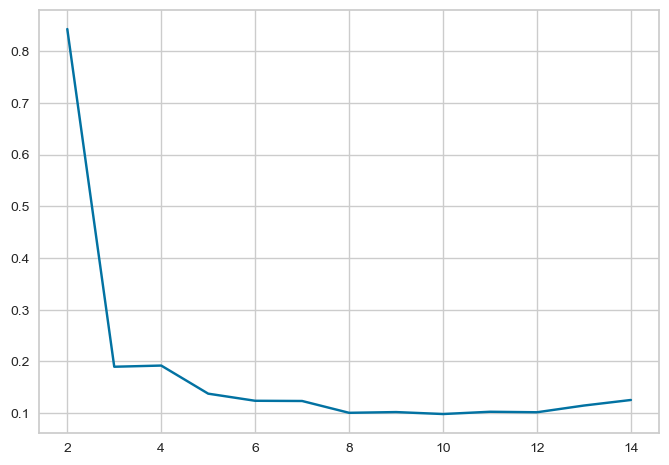

In [91]:
# Step 1: Initialize an empty list to store the silhouette scores for each cluster count
sil_score = []

# Define a list of cluster numbers to test, ranging from 2 to 9
cluster_list = list(range(2, 15)) 

# Loop through each number of clusters to evaluate clustering quality
for n_clusters in cluster_list: # for each elements inside [2,3,4,5,6,7,8,9]

    clusterer = KMeans(n_clusters=n_clusters, random_state=0)  # Create a K-Means model with the specified number of clusters
    preds = clusterer.fit_predict((k_means_scaled))  # Fit the model and get cluster predictions (assignments)

    # Compute the silhouette score, which measures how well-separated clusters are
    score = silhouette_score(k_means_scaled, preds)

    sil_score.append(score)  # Store the computed silhouette score in the list

    # Print the silhouette score for the current number of clusters
    print("For n_clusters = {}, silhouette score is {}".format(n_clusters, score))

# Plot the silhouette scores for different cluster values
plt.plot(cluster_list, sil_score)  # Create a line plot of cluster count vs. silhouette score

###### **From the silhouette scores, it seems that 6 is a good value of k.**

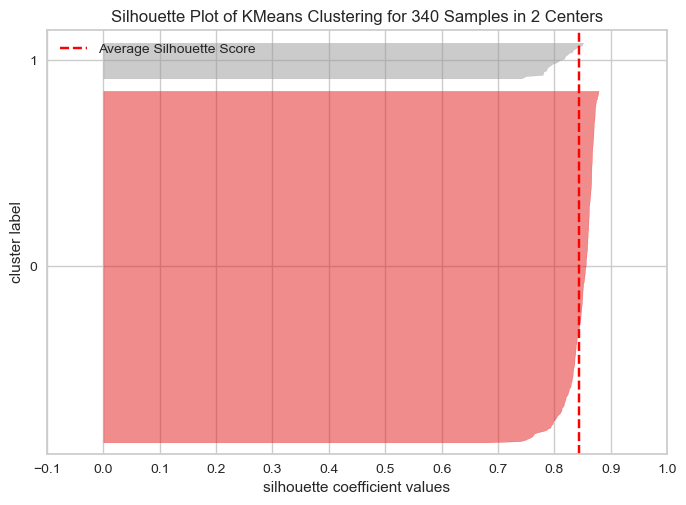

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 340 Samples in 2 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [93]:
# finding optimal no. of clusters with silhouette coefficients

visualizer = SilhouetteVisualizer(KMeans(2, random_state=0))
visualizer.fit(k_means_scaled)
visualizer.show()

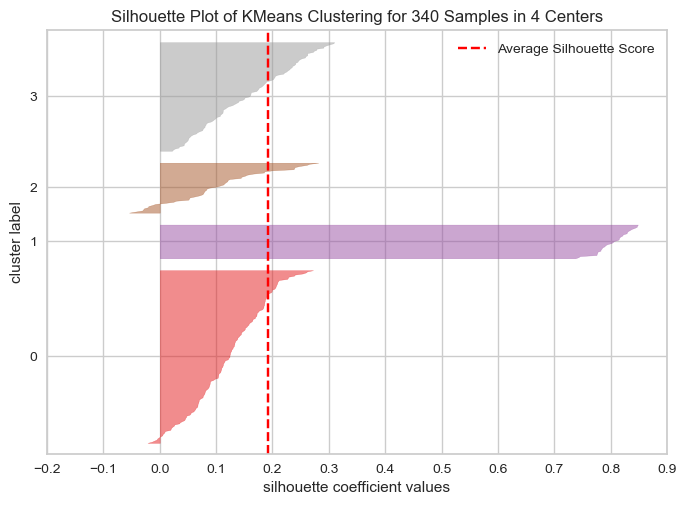

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 340 Samples in 4 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [94]:
# finding optimal no. of clusters with silhouette coefficients

visualizer = SilhouetteVisualizer(KMeans(4, random_state=0))
visualizer.fit(k_means_scaled)
visualizer.show()

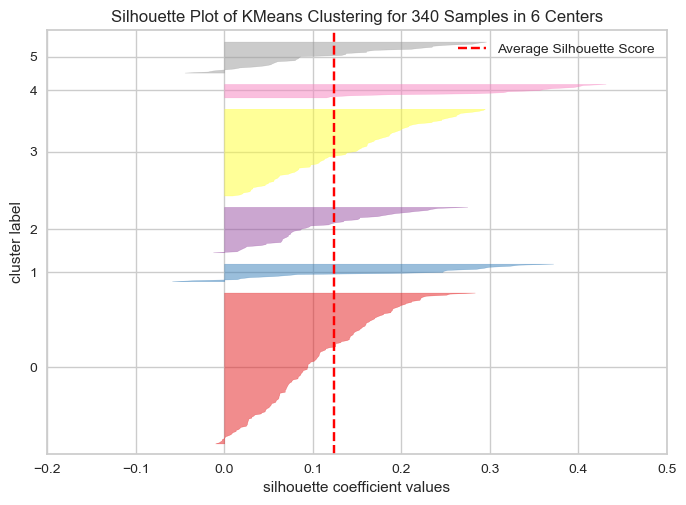

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 340 Samples in 6 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [95]:
# finding optimal no. of clusters with silhouette coefficients

visualizer = SilhouetteVisualizer(KMeans(6, random_state=0))
visualizer.fit(k_means_scaled)
visualizer.show()

In [96]:
kmeans = KMeans(n_clusters=4, random_state=0)
kmeans.fit(k_means_scaled) # numeric scaled dataframe

KMeans(n_clusters=4, random_state=0)

In [97]:
# give me the number of clusters you built

kmeans.labels_ # this is the number of clusters
df['K_means_segments'] = kmeans.labels_

In [98]:
df.head()

# K_means_segments: categorical column even that they're numbers
# you could have called them: Cluster_1, Cluster_2, Cluster_n

,Security,GICS Sector,GICS Sub Industry,Current Price,Price Change,Volatility,ROE,Cash Ratio,Net Cash Flow,Net Income,Earnings Per Share,Estimated Shares Outstanding,P/E Ratio,P/B Ratio,Market_Cap,K_means_segments
0,American Airlines Group,Industrials,Airlines,42.349998,9.999995,1.687151,135,51,-604000000,7610000000,11.39,6.681299e+08,3.718174,-8.784219,2.829530e+10,3
1,AbbVie,Health Care,Pharmaceuticals,59.240002,8.339433,2.197887,130,77,51000000,5144000000,3.15,1.633016e+09,18.806350,-8.750068,9.673986e+10,3
2,Abbott Laboratories,Health Care,Health Care Equipment,44.910000,11.301121,1.273646,21,67,938000000,4423000000,2.94,1.504422e+09,15.275510,-0.394171,6.756358e+10,3
3,Adobe Systems Inc,Information Technology,Application Software,93.940002,13.977195,1.357679,9,180,-240840000,629551000,1.26,4.996437e+08,74.555557,4.199651,4.693653e+10,2
4,"Analog Devices, Inc.",Information Technology,Semiconductors,55.320000,-1.827858,1.701169,14,272,315120000,696878000,0.31,2.247994e+09,178.451613,1.059810,1.243590e+11,2


In [99]:
# adding kmeans cluster labels to the original dataframe
df["K_means_segments"] = kmeans.labels_

In [100]:
df["K_means_segments"].value_counts()

K_means_segments
0    160
3    101
2     47
1     32
Name: count, dtype: int64

## Cluster Profiling

In [102]:
# cluster_profile = df.groupby("K_means_segments").mean()

# three elements when grouping:
# 1. 1 or more numeric column
# 2. 1 or more categorical column
# 3. Metric to measure the numeric colums (mean/median/stdv, min, max, count, sum)

cluster_profile = df.groupby("K_means_segments").mean(numeric_only=True)
cluster_profile


,Current Price,Price Change,Volatility,ROE,Cash Ratio,Net Cash Flow,Net Income,Earnings Per Share,Estimated Shares Outstanding,P/E Ratio,P/B Ratio,Market_Cap
K_means_segments,,,,,,,,,,,,
0,73.497219,3.174855,1.476805,27.212500,52.043750,3.907723e+07,7.002267e+08,3.541906,2.278562e+08,21.272279,-1.825788,1.206852e+10
1,43.487681,-7.185507,2.475658,109.500000,79.437500,-1.981526e+08,-3.651708e+09,-8.749688,4.785786e+08,60.232179,0.024945,1.494553e+10
2,103.278085,10.038506,1.622469,8.702128,108.936170,-2.785168e+07,7.134443e+08,1.408936,6.900926e+08,85.760195,-0.624864,4.783553e+10
3,93.940262,6.304312,1.258080,51.445545,77.415842,2.007955e+08,4.746310e+09,5.852772,1.108750e+09,17.094535,-2.608994,7.050833e+10


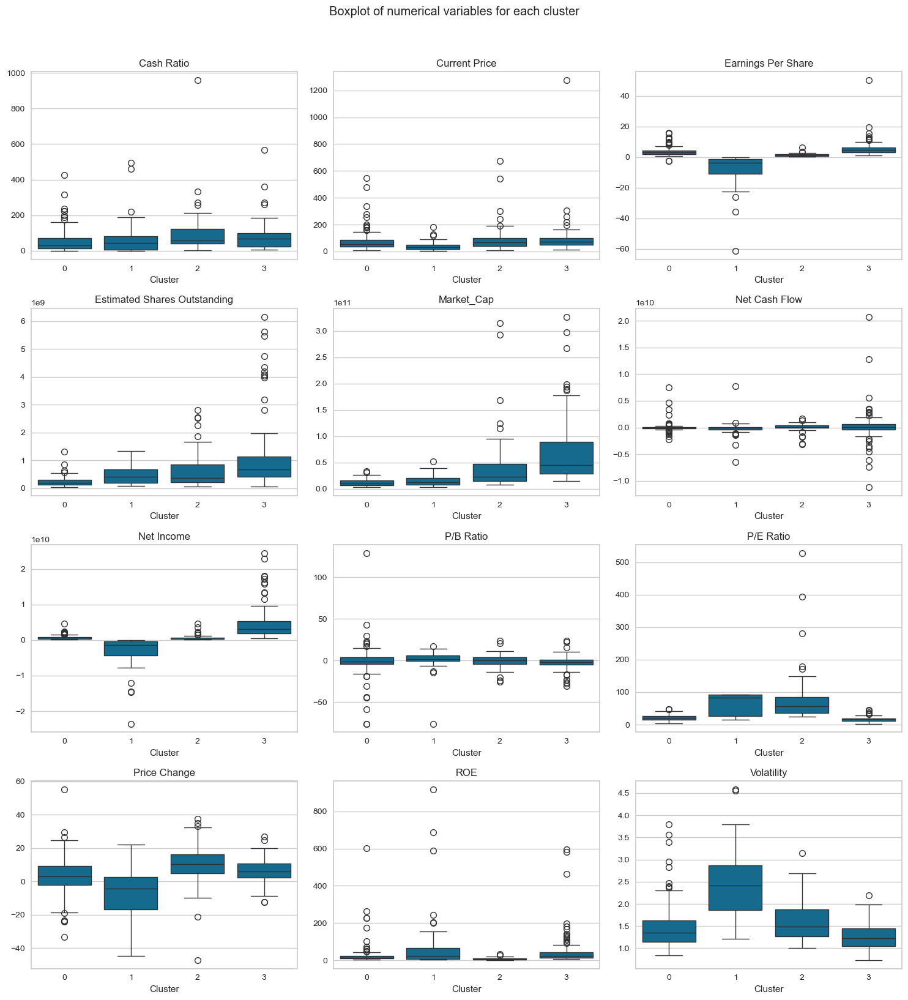

In [103]:
numerical_col = (df.select_dtypes(include=[np.number])
                   .columns.difference(["K_means_segments"])
                   .tolist())

n = len(numerical_col)
cols = 3
rows = math.ceil(n / cols)

fig, axes = plt.subplots(rows, cols, figsize=(cols*5, rows*4))
axes = np.ravel(axes)  # плоский список осей

for ax, col in zip(axes, numerical_col):
    sns.boxplot(data=df, x="K_means_segments", y=col, ax=ax)
    ax.set_title(col)
    ax.set_xlabel("Cluster")
    ax.set_ylabel("")

# скрыть лишние пустые оси (если их больше, чем признаков)
for j in range(len(numerical_col), len(axes)):
    fig.delaxes(axes[j])

fig.suptitle("Boxplot of numerical variables for each cluster", y=1.02)
plt.tight_layout()
plt.show()

<Axes: xlabel='K_means_segments'>

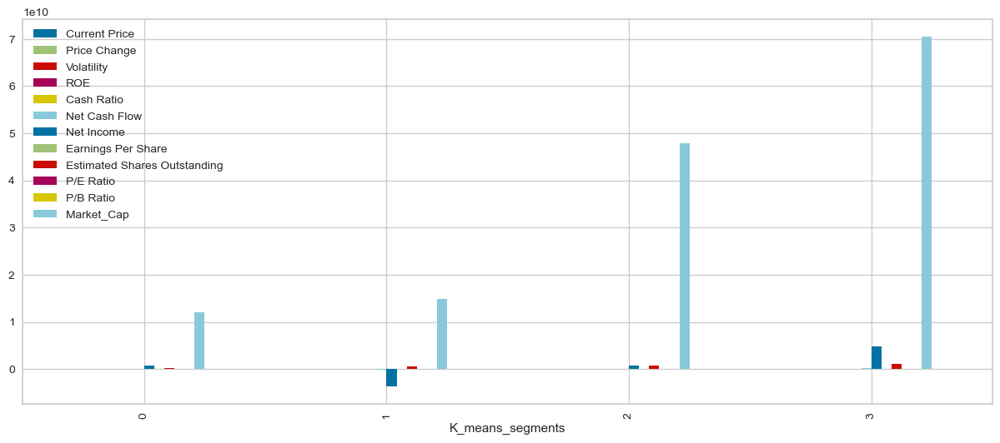

In [104]:
df.groupby("K_means_segments").mean(numeric_only=True).plot.bar(figsize=(15, 6))

#  Observations (k-means, k=4)

---
## High-Level Takeaways
- The clusters are **economically distinct** across performance, risk, profitability, valuation, and size.
---
## Cluster Personas

### Cluster 0: Momentum, Mid-Risk, Mid-Valuation (Smaller Caps)
- **Price Change**: **+17.2%** (best) with moderate **Volatility** (~1.48).
- **Profitability**: Strong, with an **ROE** of ~27% and positive Net Income/EPS.
- **Valuation**: Around the market average (**P/E** ~21).
- **Size**: Lower on average (**Market Cap** ~1.21e10).
- **→ Persona**: "Recent Winners" without extreme valuations.

### Cluster 1: Losers / Distressed & Volatile
- **Price Change**: **-7.2%** (worst) and the highest **Volatility** (~2.48).
- **Profitability**: Negative Net Income and EPS. The very high **ROE** (~109%) is likely unstable and due to a tiny equity base.
- **Valuation**: The listed **P/E** of ~60 is meaningless because EPS is negative.
- **Size**: Moderate **Market Cap** (~1.49e10).
- **→ Persona**: "Turnaround/Speculative" stocks.

### Cluster 2: Growth/Momentum with Rich Valuation
- **Price Change**: Strong at **+10.0%** with elevated **Volatility** (~1.62).
- **Profitability**: Very high, with an **ROE** of ~109% and positive NI/EPS.
- **Valuation**: The highest **P/E** at ~85.8.
- **Size**: Sizable **Market Cap** (~4.78e10).
- **→ Persona**: "High-Growth, Richly Valued" group.

### Cluster 3: Stable Mega-Caps / Value-Tilted
- **Price Change**: Positive at **+6.3%** with the lowest **Volatility** (~1.26).
- **Profitability**: Strong and stable, with an **ROE** of ~51% and the highest **EPS** (~5.85).
- **Valuation**: The lowest **P/E** at ~17.1.
- **Size**: The largest on average (**Market Cap** ~7.05e10).
- **→ Persona**: "Defensive/Blue-Chip" profile.

## Hierarchical Clustering


**Definition:**
- Hierarchical clustering is a method of cluster analysis that seeks to build a hierarchy of clusters. It involves creating a tree-like structure called a dendrogram, which illustrates the arrangement of the clusters produced by the algorithm.

**Steps for Agglomerative Hierarchical Clustering:**

1. Calculate the distance (similarity) matrix for all pairs of data points.
2. Identify the pair of clusters with the smallest distance.
3. Merge these clusters.
4. Update the distance matrix to reflect the merged clusters.
5. Repeat steps 2-4 until the desired number of clusters is achieved.


**Hierarchical clustering is useful when:**

- The number of clusters is unknown.
- You want to visualize the data in a dendrogram to understand the natural grouping and hierarchy within the data.
- You need to identify nested clusters within the data.


**Real-Life Cases:**

- Biology: Hierarchical clustering is used to create phylogenetic trees to represent the evolutionary relationships between species.
- Marketing: It helps in market segmentation to group customers with similar behaviors and preferences.
- Document Clustering: Grouping similar documents together based on the content for information retrieval and text mining.
- Image Segmentation: Dividing an image into meaningful regions for analysis in computer vision.



**Hierarchical Clustering vs. K-Means Clustering:**

- Hierarchical Clustering: Suitable for exploratory analysis when the number of clusters is unknown.
Useful for creating nested clusters and visualizing the data's hierarchical structure.

- K-Means Clustering: Preferred for large datasets and applications where the number of clusters is known in advance.
Commonly used in market segmentation, image compression, and pattern recognition.

### Checking Cophenetic Correlationn

In [109]:
h_scaled = X_scaled.copy()

In [110]:
# list of distance metrics
distance_metrics = ["euclidean", "chebyshev", "mahalanobis", "cityblock"]

# list of linkage methods
# we excluded "centroid", "ward" linkage methods here because some distance metrics don't work on all linkage methods
linkage_methods = ["single", "complete", "average", "weighted"]


# Initiate the correlation to be 0 first
high_cophenet_corr = 0
high_dm_lm = [0, 0]


# For each distance metric in your list:
# For each linkage method in your list:
# Perform hierarchical clustering with the current distance metric and linkage method.
# Calculate how well the clustering represents the original distances (cophenetic correlation).
# Print the result for this combination.

for dm in distance_metrics:
    for lm in linkage_methods:
        Z = linkage(h_scaled, metric=dm, method=lm)  # It performs hierarchical/agglomerative clustering.

        # pdist(subset_scaled_df): The pairwise distances between original data points.
        # Z: The linkage matrix.
        # c: The cophenetic correlation coefficient,
        # a single value representing the correlation between the original distances and the cophenetic distances (distances represented by the dendrogram).
        # coph_dists: The cophenetic distance matrix.
        c, coph_dists = cophenet(Z, pdist(h_scaled)) # It computes the cophenetic correlation coefficient to measure how well the hierarchical clustering preserves the original pairwise distances.

        print(
            "Cophenetic correlation for {} distance and {} linkage is {}.".format(
                dm.capitalize(), lm, c
            )
        )


        if high_cophenet_corr < c:
            high_cophenet_corr = c
            high_dm_lm[0] = dm
            high_dm_lm[1] = lm



Cophenetic correlation for Euclidean distance and single linkage is 0.9928003085452601.
Cophenetic correlation for Euclidean distance and complete linkage is 0.9805932623947026.
Cophenetic correlation for Euclidean distance and average linkage is 0.9935675277815902.
Cophenetic correlation for Euclidean distance and weighted linkage is 0.9867445102903288.
Cophenetic correlation for Chebyshev distance and single linkage is 0.9909627890865018.
Cophenetic correlation for Chebyshev distance and complete linkage is 0.9887607347737468.
Cophenetic correlation for Chebyshev distance and average linkage is 0.9932928216791471.
Cophenetic correlation for Chebyshev distance and weighted linkage is 0.9918337808391982.
Cophenetic correlation for Mahalanobis distance and single linkage is 0.24217928075795808.
Cophenetic correlation for Mahalanobis distance and complete linkage is 0.3669820381017779.
Cophenetic correlation for Mahalanobis distance and average linkage is 0.38799934507004175.
Cophenetic 

In [111]:
# printing the combination of distance metric and linkage method with the highest cophenetic correlation
print(
    "Highest cophenetic correlation is {}, which is obtained with {} distance and {} linkage.".format(
        high_cophenet_corr, high_dm_lm[0].capitalize(), high_dm_lm[1]
    )
)

Highest cophenetic correlation is 0.9935675277815902, which is obtained with Euclidean distance and average linkage.


**Let's explore different linkage methods with Euclidean distance only.**

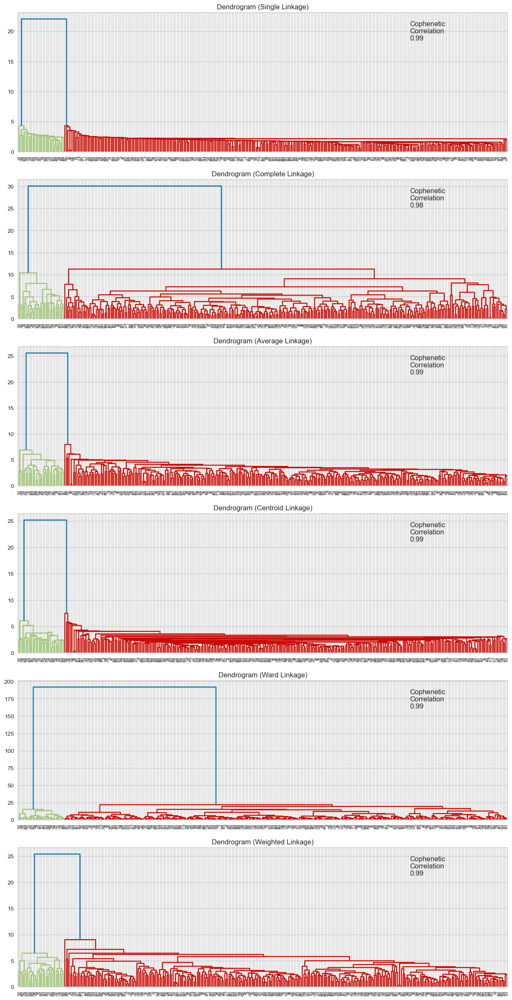

In [113]:
# list of linkage methods
linkage_methods = ["single", "complete", "average", "centroid", "ward", "weighted"]

# lists to save results of cophenetic correlation calculation
compare_cols = ["Linkage", "Cophenetic Coefficient"]

# to create a subplot image
fig, axs = plt.subplots(len(linkage_methods), 1, figsize=(15, 30))

# We will enumerate through the list of linkage methods above
# For each linkage method, we will plot the dendrogram and calculate the cophenetic correlation
for i, method in enumerate(linkage_methods):
    Z = linkage(h_scaled, metric="euclidean", method=method)

    dendrogram(Z, ax=axs[i])
    axs[i].set_title(f"Dendrogram ({method.capitalize()} Linkage)")

    coph_corr, coph_dist = cophenet(Z, pdist(h_scaled,))
    axs[i].annotate(
        f"Cophenetic\nCorrelation\n{coph_corr:0.2f}",
        (0.80, 0.80),
        xycoords="axes fraction",
    )

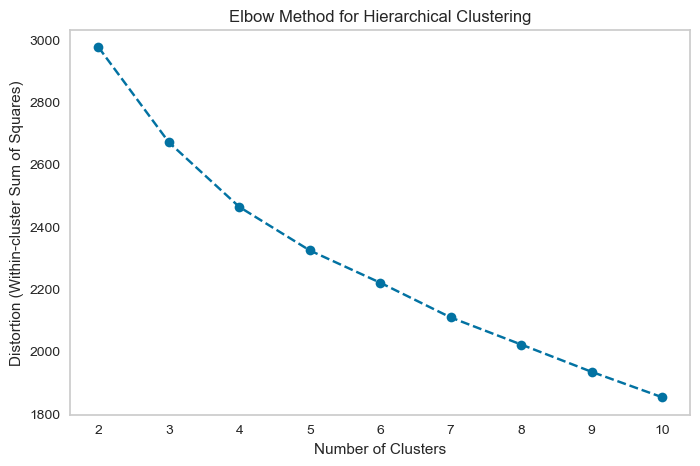

In [114]:


# Compute within-cluster variance (distortion) for different cluster numbers
distortions = []
K = range(2, 11)  # Try cluster numbers from 1 to 10

for k in K:
    if k == 1:
        distortions.append(0)  # Single cluster has no within-cluster variance
    else:
        clustering = AgglomerativeClustering(n_clusters=k, linkage='ward') # fine my clusters to be k clusters with a ward linkage method
        labels = clustering.fit_predict(h_scaled)

        # Compute distortion (sum of squared distances from each point to its cluster centroid)
        # measures the sum of sqaure distance and error between each cluster vs. within the datapoints inside each cluster
        # computes within-cluster variance and between each cluster
        centroids = np.array([k_means_scaled[labels == i].mean(axis=0) for i in range(k)])
        distortion = sum(np.min(pairwise_distances(k_means_scaled, centroids), axis=1)**2)
        distortions.append(distortion)

# Plot the Elbow Curve
plt.figure(figsize=(8, 5))
plt.plot(K, distortions, marker='o', linestyle='--')
plt.xlabel("Number of Clusters")
plt.ylabel("Distortion (Within-cluster Sum of Squares)")
plt.title("Elbow Method for Hierarchical Clustering")
plt.grid()
plt.show()

In [115]:
HCmodel = AgglomerativeClustering(n_clusters=4, metric="euclidean", linkage="average") # define before you train before you predict or fit
HCmodel.fit(h_scaled) # then apply to the data

AgglomerativeClustering(linkage='average', n_clusters=4)

In [116]:
HCmodel.labels_
df["HC_Clusters"] = HCmodel.labels_

In [117]:
df.head()

,Security,GICS Sector,GICS Sub Industry,Current Price,Price Change,Volatility,ROE,Cash Ratio,Net Cash Flow,Net Income,Earnings Per Share,Estimated Shares Outstanding,P/E Ratio,P/B Ratio,Market_Cap,K_means_segments,HC_Clusters
0,American Airlines Group,Industrials,Airlines,42.349998,9.999995,1.687151,135,51,-604000000,7610000000,11.39,6.681299e+08,3.718174,-8.784219,2.829530e+10,3,0
1,AbbVie,Health Care,Pharmaceuticals,59.240002,8.339433,2.197887,130,77,51000000,5144000000,3.15,1.633016e+09,18.806350,-8.750068,9.673986e+10,3,0
2,Abbott Laboratories,Health Care,Health Care Equipment,44.910000,11.301121,1.273646,21,67,938000000,4423000000,2.94,1.504422e+09,15.275510,-0.394171,6.756358e+10,3,0
3,Adobe Systems Inc,Information Technology,Application Software,93.940002,13.977195,1.357679,9,180,-240840000,629551000,1.26,4.996437e+08,74.555557,4.199651,4.693653e+10,2,0
4,"Analog Devices, Inc.",Information Technology,Semiconductors,55.320000,-1.827858,1.701169,14,272,315120000,696878000,0.31,2.247994e+09,178.451613,1.059810,1.243590e+11,2,0


In [118]:
df["HC_Clusters"].value_counts()

HC_Clusters
0    307
1     29
3      3
2      1
Name: count, dtype: int64

### Cluster Profiling

In [120]:
cluster_profile = df.groupby("HC_Clusters").mean(numeric_only=True)
cluster_profile

,Current Price,Price Change,Volatility,ROE,Cash Ratio,Net Cash Flow,Net Income,Earnings Per Share,Estimated Shares Outstanding,P/E Ratio,P/B Ratio,Market_Cap,K_means_segments
HC_Clusters,,,,,,,,,,,,,
0,84.972871,5.419061,1.421731,32.436482,69.247557,8.244193e+07,2.034829e+09,3.986824,5.809287e+08,29.353882,-1.899378,3.668673e+10,1.286645
1,47.352613,-3.977625,2.285682,84.896552,86.655172,-9.585800e+07,-2.946816e+09,-8.282069,4.545816e+08,61.486915,-0.054144,1.604052e+10,1.000000
2,14.920000,-47.129693,3.139352,1.000000,7.000000,-8.600000e+07,2.530000e+08,0.100000,2.530000e+09,149.200000,-1.894071,3.774760e+10,2.000000
3,6.126667,-38.195030,4.312089,347.333333,9.666667,-1.187000e+09,-1.046567e+10,-13.270000,7.105488e+08,48.103056,0.789476,4.360599e+09,1.000000


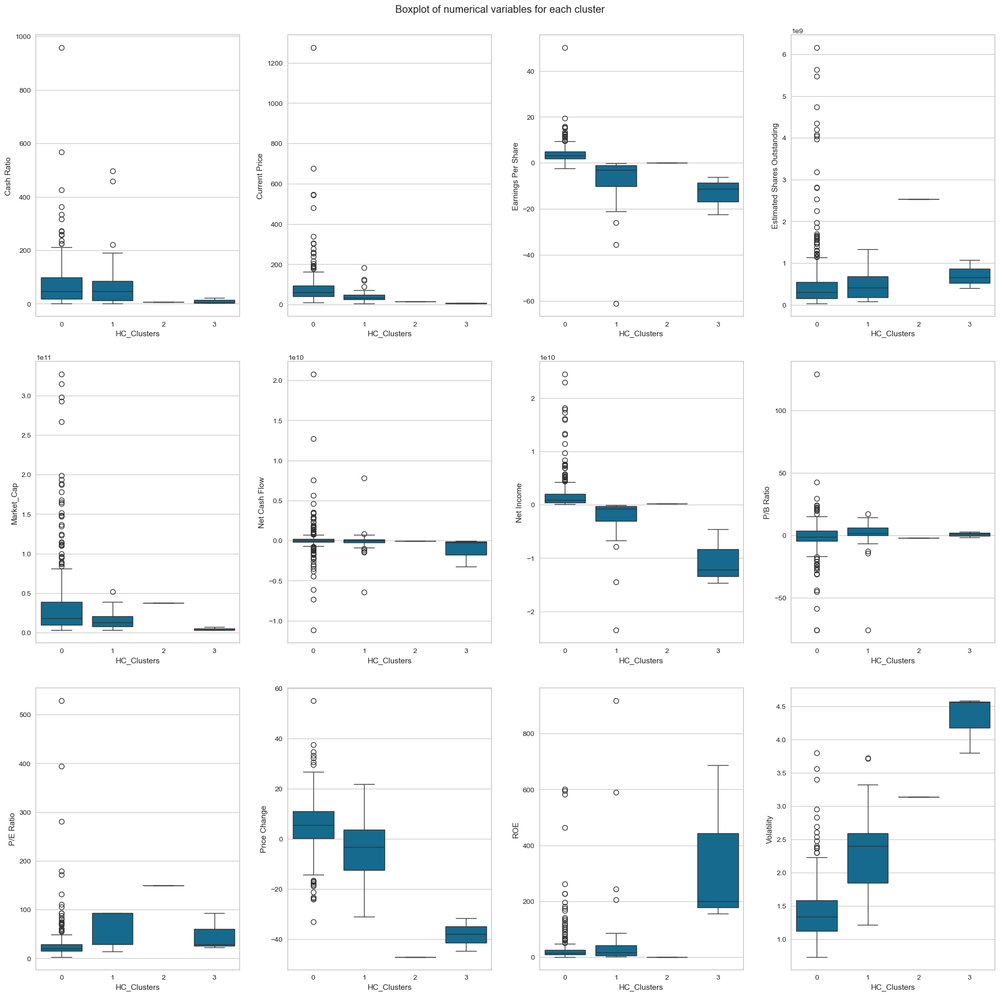

In [121]:
plt.figure(figsize=(20, 20))
plt.suptitle("Boxplot of numerical variables for each cluster")

for i, variable in enumerate(numerical_col):
    plt.subplot(3, 4, i + 1)
    sns.boxplot(data=df, x="HC_Clusters", y=variable)

plt.tight_layout(pad=2.0)

Observations (k=4)d.

## High-level takeaways
- Clusters separate along **performance (Price Change)**, **risk (Volatility)**, **profitability (ROE/NI/EPS)**, **valuation (P/E, P/B)**, and **size (Market Catable.

## Cluster profiles

**HC 0 — Balanced/quality with positive performance**  
- *Price Change* **+5.4%**, *Volatility* **~1.42** (moderate).  
- Profitable: positive *Net Income* and *EPS*; *ROE* **~32%**.  
- *P/E* **~29**; *P/B* **≈ −1.9** (signals negative book equity for some members).  
- Larger size: *Market Cap* **~3.7e10**.  
- **Interpretation:** broadly healthy names with moderate risk and reasonable valuation; negative P/B deserves a check.

**HC 1 — Distressed & volatile**  
- *Price Change* **−4.0%**, *Volatility* **~2.29** (high).  
- Loss-making: *Net Income* and *EPS* **negative**; *ROE* **~85%** likely inflated by tiny equity (unstable).  
- *P/E* **~61** (not meaningful with negative EPS); *P/B* slightly **negative**.  
- *Market Cap* **~1.6e10**.  
- **Interpretation:** turnaround/speculative group with elevated risk.

**HC 2 — Extreme drawdown, high multiple (likely tiny cluster)**  
- *Price Change* **−47%**, *Volatility* **~3.14** (very high).  
- *ROE* **~1%**, *Cash Ratio* low; *NI* slightly **positive**, *EPS* **~0.1**.  
- *P/E* **~149**, *P/B* **≈ −1.9**; *Shares Outstanding* very large.  
- *Market Cap* **~3.8e10**.  
- **Interpretation:** special-situations/outlier-like names (deep drawdown + extreme valuation). Treat with caution.

**HC 3 — Microcap/very distressed (likely very small cluster)**  
- *Price Change* **−38%**, *Volatility* **~4.31** (extreme).  
- Heavily loss-making: *NI* **~ −1.05e10**, *EPS* **~ −13.3**; *ROE* **~347%** (artifact of near-zero equity).  
- *P/E* **~48** (not interpretable with negative EPS); *P/B* **~0.79**.  
- Smallest *Market Cap* **~4.4e9**.  
- **Interpretation:** highly stressed micro-cato strengthen the business interpretation.

## K-means vs Hierarchical Clustering

You compare several things, like:
- Which clustering technique took less time for execution?
- Which clustering technique gave you more distinct clusters, or are they the same?
- How many observations are there in the similar clusters of both algorithms?
- How many clusters are obtained as the appropriate number of clusters from both algorithms?

You can also mention any differences or similarities you obtained in the cluster profiles from both the clustering techniques.

**1) Which technique was faster to run?**  
**K-means**. On our data (≈340×features), K-means completes in a fraction of a second per `k` even with `n_init=50`, while **Hierarchical (Ward)** is `O(n²)` in time/memory and runs noticeably slower. Both are “fast enough” here, but K-means is consistently quicker.

**2) Which technique produced more distinct / usable clusters?**  
**K-means** produced **more compact and better balanced** clusters at `k=4`.  
Hierarchicaltends to **isolate a few tiny, distressed/outlier groups** and one or two large clusters; this is visible in the HC profiles (deep drawdowns, very high volatility, negative EPS/NI). For business use, K-means gives cleaner segments, while Hierarchical is helpful to **expose outlier sub-groups** inside the distressed names.

**3) How many observations fall into similar clusters across both methods?**  
Qualitatively, both methods **agree on the major themes** (healthy/core vs. distressed/high-risk). Hierarchical’s small clusters are mostly **subsets** of K-means’ distressed segment.  

**4) How many clusters are appropriate?**  
- **K-means:** The silhouette & elbow analyses point to k = 4.  
- **Hierarchical:** The elbow also suggests **`k ≈ 4`**; at higher `k` the gains become marginal and small noisy clusters appear.  

## Actionable Insights and Recommendations

### Segment narratives

- **Cluster 3 — Defensive / “blue-chip” quality**
  - Lowest volatility, strongest profitability (NI, EPS, ROE), **lowest P/E**; largest caps.
  - **Action:** Core holdings. Overweight for low-risk mandates. Reinvest on dips; use as ballast during drawdowns.

- **Cluster 2 — Growth / richly valued momentum**
  - High recent performance, strong liquidity (cash ratio), **very high P/E** with moderate profitability.
  - **Action:** Selective exposure with **position caps**. Require fundamental momentum (sales/EPS growth) and risk controls (stop-loss/volatility caps). Avoid if valuation expands without earnings follow-through.

- **Cluster 0 — Momentum-light, mid-risk, fair valuation**
  - Mild positive returns, mid volatility, decent profitability, market-like P/E; smaller caps.
  - **Action:** Tactical sleeve. Pair with risk filters (e.g., Volatility ≤ 1.6) and catalysts (earnings surprises, upgrades). Good source for **upgrades to Cluster 3** candidates.

- **Cluster 1 — Distressed / high-risk**
  - Negative returns, **highest volatility**, **negative EPS and NI**, cash burn.
  - **Action:** Avoid in core. Restrict to event-driven trades only (restructurings, asset sales). Require **EPS turn-positive** and **volatility normalization** before reconsidering.

---

### Concrete screening rules (example)

- **Core (Cluster 3-like):** `Volatility ≤ 1.4` AND `EPS > 0` AND `P/E ≤ 25`.
- **Selective growth (Cluster 2-like):** `Price Change ≥ 8–10%` AND `P/E ≥ 50` AND `EPS > 0` AND `Cash Ratio ≥ 80`.
- **Momentum-light (Cluster 0-like):** `Price Change 2–6%` AND `1.3 ≤ Volatility ≤ 1.6` AND `P/E 15–30`.
- **Distressed filter (Cluster 1-like):** `EPS ≤ 0` OR `Net Income < 0` OR `Volatility ≥ 2.0` → **Exclude** (unless special-situations playbook).

---

### Portfolio actions

- **Allocate:** Overweight **Cluster 3**, measured allocation to **Cluster 2**, tactical allocation to **Cluster 0**, **underweight/avoid Cluster 1**.
- **Risk:** Apply **position caps** for Cluster 2 (valuation risk) and **tight risk limits** for Cluster 0 (momentum decay). Hard excludes or tiny sizing for Cluster 1.
- **Hedging:** If portfolio tilts to Cluster 2, pair with Cluster-3 names or sector/market hedges to control drawdown.

---

### Monitoring & rebalancing

- **Monthly** refresh clusters; track **transition matrix** 
  - **Upgrade signals:** EPS turns positive, P/E contracts, volatility drops below 1.6.  
  - **Downgrade signals:** EPS slips negative, volatility > 2.0, rapid P/E expansion.
- Watch **sector mix** inside clusters (e.g., Energy or Health Care concentrations) and manage unintended tilts.